# Abstract
This project is designed to estimate NHL player cap hit using a combination of standard and advanced analytics. Others have modeled player salaries compared to different metrics usually centered around goals, assists, and position. This project will expand further then those metrics to include WAR (wins above replacement), Corsi (shot metric), as well as various other metrics.

# Introduction
## The Problem
Sports is a multi-billion dollar industry with the four major sports in the United States being Hockey, baseball, football, and basketball. The NHL, like most professional sports, is structured by a collective bargening agreement (CBA) that, among other things, sets the financial rules and regulations that both the players and teams must abide by. These regulations include a cap system in which every team has the same upper bound on their budget for players. While there are teams that have internal budgets that are smaller we will assume that these do not effect player salaries significantly (i.e. their mix of players are either all lower cap hit or less high cap hit players combined with more low cap hit players). This assumption greatly reduces the complexities of the problem and, as you will see, this assumption doesn't inhibit the model. This makes predicting a players cap hit given his performance the season an important metric for any general manager of a hockey team so that they can maximize their ROI and build the best team when free agency opens. 

## The Importance
The salary cap for the 2017-2018 season, the year the data was taken from, was `$`79.9 Million dollars with a minimum salary of `$`650,000. While this is Behseta's weekend expenses, for us normal individuals this is a significant amount of money so being able to succesfully find the best way to maximize the dollars is what seperates the Stanley Cup winners from the draft winners (given to the last place team, kind of). When this type of money is being awarded it can be extremely detrimental to a team's construction, and the owners pockets, if a bad contract was given out. 

### The Case of Clayton Stoner
To highlight this importance I would like to look at the posession numbers of Clayton Stoner in his last season with the Minisotta Wild, 2013-2014, prior to signing with the Anaheim Ducks. The defensmen only played 63 games with 1 goal, 5 assists, and a -6 plus/minus (plus/minus is known within the analytics community to be garbage, technical term, but still a well referenced stat in the media). These numbers are decent for a 5th year defensmen; however, looking at his posession numbers we see that his team had 597 shots for (CF: Corsi For) while the opponents had 663 shots against (CA: Corsi Against) for a CF% of 47.4 and a CF% rel of -2.7 meaning his team was outshot while he was on the ice and his team did worst then the teams average by 2.7 shots per 60 minutes of play(www.hockey-reference.com/). This shows that while he has strong showings in the standard statistics he is falling way behind in posession numbers. Minissota was paying him approximatly 1 million dollars and the Anaheim Ducks signed him for approximately 3 million dollars per year, effectively ranking him by pay their 3rd or 4th best defensmen. Fast forward a couple of years to when the NHL had an expansion draft in 2017 the Anaheim Ducks gave up a top prospect, Sea Theodor, as insentive for Las Vegas to take Clayton Stoner's terrible contract(https://www.ocregister.com/2017/06/21/to-keep-coveted-defenders-ducks-sacrifice-shea-theodore-as-vegas-takes-clayton-stoner/). Theodor has blossomed into a top 3 defensman on one of the best teams in the league since then while Stoner was placed on Injured Reserve and never to be seen again, except on the cap hit. 

### The Case of Adam Henrique
On the other side of this situation I would like to look at Adam Henrique's situation. Henrique played for the New Jersey Devils, a team solidly built upon and played a defense first system that hindered scoring numbers. As a result Henrique never scored more then 30 goals and 20 assists for 50 points in 80 games with New Jersey in 2015-2016; however, after being traded to Anaheim in 2017-2018 Henrique scored 20 goals and 16 points for 36 in just 57 games for a slight incrase in points per game. His posession numbers show that he started 59.1% of the time in the defensive zone, a 9% increase over his 2015-2016 season with NJ, indicating he slightly increased his offensive production even though he was put in a position to defend much more often (www.hockey-reference.com/). Looking within our dataset we see that Adam Henrique's cap hit was a much better ROI of 4 million given these analytics.

## The Dataset
The dataset comes to us via Rob Vollman's tedious work and can be found at (http://www.hockeyabstract.com/testimonials). Vollman is well known in the NHL analytics community and has published multiple books describing the advanced analytics within hockey and its development over the years, I highly recommend picking up one of his books. Currently you can see his name listed as Senior Analyst within the Los Angelas King's orginization. 


## Feature Breakdown/Selection
In the original file the metrics are grouped into parent sections: Player Information, Primary Stats, Individual Stats, Faceoff Stats, Individual Goal and Shot Breakdown, Penalty Stats, On-Ice Team Stats, Catch-All, Other, Contract Information, Equipment, and Career Stats. I eliminated the parent section Faceoff Stats since the center position will dominate these statistics (based on common hockey knowledge), Individual goal and Shot breakdown was eliminated because it was too granular and is captured in other metrics, Penalty stats were not considered as they are too complicated to impliment in a productive way, equipment was elimited because it is doubtful this is considered/should be considered in contract negotiations, and Career stats were eliminated because contracts are typically based on more recent performance rather then career performance. From the remaining parent groups I kept age and seasons from player information; games played (GP), goals (G), assists (A), time on ice per games played TOI/GP and penalties in minutes (PIM) from Primary Stats; individual Corsi for(iCF), individual scoring chance for (iSCF) and  Pass from individual stats; offensive wins above replacement (OWAR) and defensive wins above replacement (DWAR) from the Catch-All section. In addition Cap Hit was retained from the Contract Information.


## Reasoning for Selection
Originally I attempted to allow Lasso, Backward Elimination, or PCA reduce the feature selection; however, the features were extremely coorilated. This lead to these methods cutting fairly extremely and, at times, dropping features that are clearly important. As a result I used a combination of my own understanding of Hockey and analyzing what others had done (See Liturature Review). This yeilded me to believe there could be a net gain in using the standard metrics while adding some shot/posession metrics and performance (WAR) metrics. I believe utilizing more of these "advanced analytics" will allow for models to better select which players are overpriced and under priced or allow the "better" player to be chosen when goals and assists are the same; however, this is outside the scope of this project as we are building a basis for predicting player cap hit.

## Literature  Review
On kaggle there are a few notebooks that address predicting NHL salaries (Cap Hit is a proxy to this) in various different ways; however, one seems to be better developed then the rest. Cam Nugent used a similar data set to the one in this project and did some extensive EDA in his notebook (https://www.kaggle.com/camnugent/nhl-salary-data-prediction-cleaning-and-modeling). It appears Cam did some initial modeling with too many predictors and has lead to sub-par results. Mike Roher has a better report developed on github that produced similar results to Cam using a different dataset (https://github.com/mikeroher/nhl-salary-analytics). Again, it appears that too many features were used and caused issues for the model to be able to hone in on the most important features. Roher has interesting tables that show how off his prediction was compared to the expected value of the players that was interesting. Viktor Seregelyi's page has a more polished approach then the previous examples, not surprising considering he lists his profession as "an economist and data scientist." He used SVM, KNN, Random Forest, Bayesian Regularized NN, and Boosted GLM for his results with K-NN performing the best of the models tested (https://viktorseregelyi.github.io/hockey/). Leo H Kahane's work is more mature in scope then this project, but expanding into the areas he is presenting on would be the next logical step. The presentation does not show to much of the backend work, but shows players over valued for their ROI and analysis if certain teams will have cap issues based on raising player performance and new contract those players are afforded (https://www.researchgate.net/publication/24069978_Team_and_Player_Effects_on_NHL_Player_Salaries_A_Hierarchical_Linear_Model_Approach).


In [1]:
#libraries to be used
#jupyter nbconvert --to hide_code_latexpdf Final_Again.ipynb
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import time
import xlsxwriter
from PIL import Image
import os
from PIL.ExifTags import TAGS
import piexif
import random
from os import listdir
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.datasets import load_boston

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import plotly

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import RidgeCV, LassoCV, Ridge, Lasso
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.metrics import accuracy_score
from sklearn.utils import resample
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix 
from sklearn.pipeline import Pipeline
from sklearn import decomposition, datasets
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn import datasets, svm
from sklearn.svm import SVC
from sklearn.metrics import explained_variance_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error


import warnings
%matplotlib inline

In [2]:
#figure printing settings
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'png')
plt.rcParams['savefig.dpi'] = 75
plt.rcParams['figure.autolayout'] = False
plt.rcParams['figure.figsize'] = 10, 6
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['font.size'] = 16
plt.rcParams['lines.linewidth'] = 2.0
plt.rcParams['lines.markersize'] = 8
plt.rcParams['legend.fontsize'] = 14

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = "serif"
plt.rcParams['font.serif'] = "cm"
#plt.rcParams['text.latex.preamble'] = r"\usepackage{subdepth}, \usepackage{type1cm}"

In [3]:
#Read in file
xls18 = pd.ExcelFile('NHL 2017-18.xls')
season18 = pd.read_excel(xls18, 'TOT',header=2)

In [4]:
#preview of data
season18.head()

,Born,City,Pr/St,Cntry,Nat,Ht,Wt,DftYr,DftRd,Ovrl,...,G.1,A.1,PTS.1,+/-.1,PIM.1,Shot,TOI.4,OPS.1,DPS.1,PS.1
0,1989-11-21,Dorchester,MA,USA,USA,77,215,2008.0,2.0,60.0,...,54,55,109,-29,149,530,4120,6.9,3.2,10.1
1,1987-12-23,Helsinki,NaN,FIN,FIN,74,212,2008.0,3.0,65.0,...,33,75,108,19,134,298,4109,4.2,5.5,9.7
2,1990-06-07,Winnipeg,MB,CAN,CAN,75,210,2008.0,3.0,69.0,...,29,83,112,-46,238,652,8141,5.5,14.8,20.4
3,1982-04-18,Regina,SK,CAN,CAN,74,215,2000.0,1.0,6.0,...,327,380,707,66,1809,2777,19535,57.8,23.6,81.4
4,1981-03-24,Bolton,CT,USA,USA,75,205,2000.0,1.0,13.0,...,53,223,276,-61,410,1292,20909,10.5,41.0,51.5


# Exploring the Data (EDA)
In this coorelation we are comparing the top 50 features to see how they influence eachother. We can see that they are highly coorilated (Forecasting: Principles and Practice by Rob J Hyndman 5.9). While this isn't an issue for prediction it can cause issues with understanding why our model is peforming the way it is. In addition, we have to worry about the increased feature set causing problems with convergence and other issues so this suggests we should limit the number of features used since there is so much overlap betweent them.

In [5]:
#create correlation matrix for heat map
corr = season18[season18.columns[0:100]].corr()

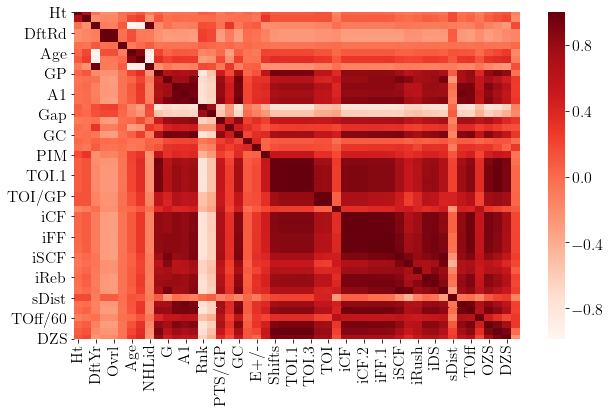

In [6]:
#an example of the correlation issue
sns.heatmap(corr.loc[corr.columns[0:50],corr.columns[0:50]], cmap=plt.cm.Reds)

From our exploration of liturature earlier it became very apparenent that goals, assists, and position were key to the modeling of our data so we will keep those metrics. In addition I believe that the structure of the CBA makes a younger Age important while performance drop off creates a necessity of age over time. It is well known that over time players get better, typically peaking in the mid 20's for skaters, for period of time before ol' Mr. Time catches up and their bodys begin to break down leading to worst performance over time (See Corey Perry). Thus I expect age to be a pivotal part in estimating salaries of players. Similarly, we expect the number of seasons you have played in the league aid in development and skill so I expect this to help the age metric when predicting. PIM I think will be a small influence for non scorers while this project is really centered on implimenting iCF, iSCF, OWAR, and DWAR to explore their power in influencing our predictions.

In [7]:
season18Less=season18[['Last Name','Age','Seasons','Position','GP','G','A','PIM','TOI/GP','iCF','iSCF','Pass','OWAR','DWAR','Cap Hit']]
#season18Less=season18[['Cap Hit']]

Position is our only feature that is not numeric so we explored the different values that this feature can have and given the scarcity of RW/C, LW/C, LW/RW, and C/RW any row that contained these multiple position flags were removed and then the column "Position" was one hot encoded after dropping all NA columns (players that did not play enough for metrics)

In [8]:
season18['Position'].unique()

array(['RW', 'C', 'D', 'LW', 'LW/C', 'RW/C', 'LW/RW', 'C/RW'],
      dtype=object)

In [9]:
season18Less=season18Less[season18Less['Position']!='RW/C']
season18Less=season18Less[season18Less['Position']!='LW/C']
season18Less=season18Less[season18Less['Position']!='LW/RW']
season18Less=season18Less[season18Less['Position']!='C/RW']

In [10]:
season18Less.dropna(inplace=True)

In [11]:
season18Less.reset_index(inplace=True,drop=True)

In [12]:
season18HC=season18Less.copy()

In [13]:
season18Less=pd.get_dummies(season18Less, columns=['Position'])
season18Less=season18Less[season18Less.columns[1:]]

Now that we have cleaned the data how does the new correlation look? This is still has some pretty correlated features; however, we already said that some correlation is okay and this is much better then the first correlation graph we had.

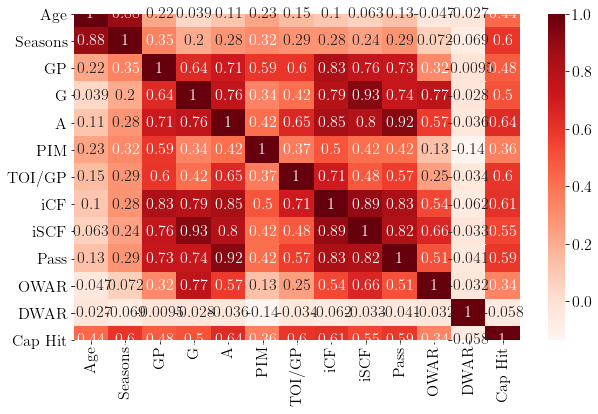

In [14]:
corr=season18Less.corr()
sns.heatmap(corr.loc[corr.columns[0:13],corr.columns[0:13]],annot=True, cmap=plt.cm.Reds)

In [15]:
import plotly.express as px
import plotly.graph_objects as go
#from pdpbox.pdp import pdp_interact,pdp_interact_plot
from IPython.display import Image

In [16]:
season18HC.loc[~((season18HC['G']>season18HC['G'].quantile(.99))|(season18HC['A']>season18HC['A'].quantile(.99))|
            (season18HC['PIM']>season18HC['PIM'].quantile(.99))|(season18HC['DWAR']<season18HC['DWAR'].quantile(.005))|
            (season18HC['OWAR']<season18HC['OWAR'].quantile(.005))|(season18HC['OWAR']>season18HC['OWAR'].quantile(.995))|
            (season18HC['TOI/GP']>season18HC['TOI/GP'].quantile(.99))|(season18HC['DWAR']>season18HC['DWAR'].quantile(.995))|
            (season18HC['Pass']>season18HC['Pass'].quantile(.99))|(season18HC['Seasons']>season18HC['Seasons'].quantile(.99))|
            (season18HC['iCF']>season18HC['iCF'].quantile(.99))|(season18HC['iSCF']>season18HC['iSCF'].quantile(.99))|
            (season18HC['Cap Hit']>season18HC['Cap Hit'].quantile(.99))),'Last Name']

0         Hayes
1       Lehtera
2         Stone
3      Hartnell
4       Hainsey
         ...   
838        Ness
839       Dalpe
840     Hamonic
841      Stepan
842      Reinke
Name: Last Name, Length: 772, dtype: object

In [17]:
#remove names that are not in the top 1% of at least one of the metrics to clean up graphing
season18HC.loc[~((season18HC['G']>season18HC['G'].quantile(.99))|(season18HC['A']>season18HC['A'].quantile(.99))|
            (season18HC['PIM']>season18HC['PIM'].quantile(.99))|(season18HC['DWAR']<season18HC['DWAR'].quantile(.005))|
            (season18HC['OWAR']<season18HC['OWAR'].quantile(.005))|(season18HC['OWAR']>season18HC['OWAR'].quantile(.995))|
            (season18HC['TOI/GP']>season18HC['TOI/GP'].quantile(.99))|(season18HC['DWAR']>season18HC['DWAR'].quantile(.995))|
            (season18HC['Pass']>season18HC['Pass'].quantile(.99))|(season18HC['Seasons']>season18HC['Seasons'].quantile(.99))|
            (season18HC['iCF']>season18HC['iCF'].quantile(.99))|(season18HC['iSCF']>season18HC['iSCF'].quantile(.99))|\
            (season18HC['Cap Hit']>season18HC['Cap Hit'].quantile(.99))),'Last Name']=''

## Feature Overview

As I stated earlier it is thought that performance and age are connected so we graphed age compared to Seasons, GP, G, A, PIM, TOI/GP, iCF, iSCF, Pass, OWAR, and DWAR and then colored each point on a scale with blue being lower cap hit while yellow is a higher cap hit. Only players that fell into the top 1% of at least one feature was kept for graphing purposes so that clutter could be reduced on the graph (DWAR and OWAR took top 0.5% and lower 0.5% given their nature). We see that typically there is a peak around 25 years of age for offensive productivity and cap hit with some high producing youngsters (a consequence of the CBA). Interestingly we see that DWAR, which measures defensiver performance, seems to have a spike around 25 and then another spike closer to about 31 which seems to agree with common hockey knowledge that the defensive side of a players game usually takes longer to develop for most then offensive side of a players game. In addition, many of the names we see are the ones we expect to see as they are names most hockey fans would recognize as being good players and/or timeless wonders who are still in the league despite their age (Ovechkin, McDavid aka McJesus, Jager, Karlson, etc.).

## Feature Plots

In [18]:
season18HCAgg=season18HC.groupby(['Position']).mean().reset_index()

The following bar plots are comparing the different positions to our other features. The differences that we see in the bar graphs are what I expect them to be. It appears that the positions can be seperated into three groupings if needed: "Centers", "Defense", and "Wingers" where Wingers are RW and LW. Defense seems to have lower offensive numbers (G,A,Pass,iSCF) and higher TOI/GP. There is a typical ideology that you build a hockey team "down the middle" and then back to front. This means that your most important players are Goalie and Centers ("down the middle") and then defensemen (Back) and then wingers (Front). Thus it makes sense that Centers and Defensemen (in that order) are our highest average paid players (goalies are not in the data set).

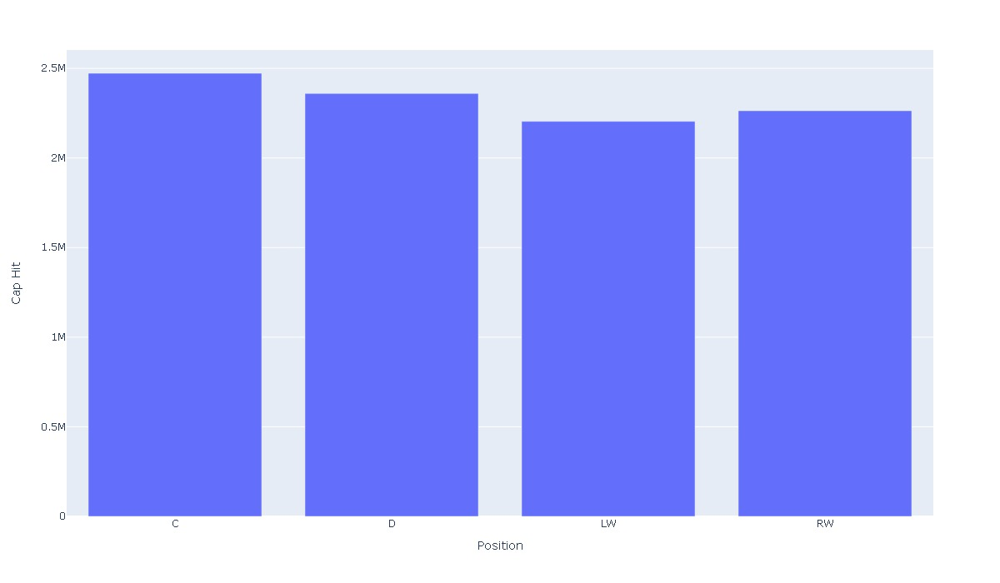

In [19]:
fig = px.bar(season18HCAgg, x='Position', y='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

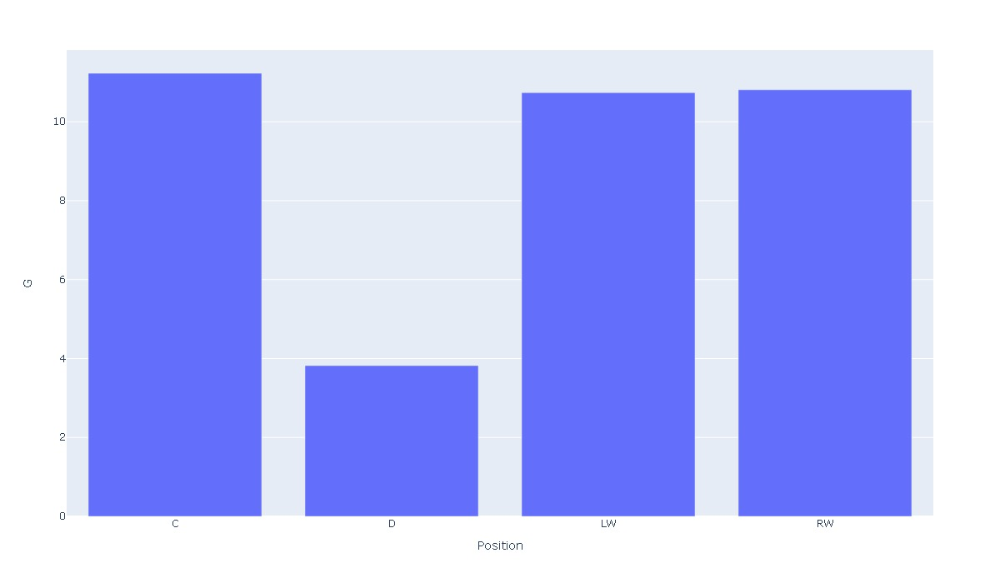

In [20]:
fig = px.bar(season18HCAgg, x='Position', y='G')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

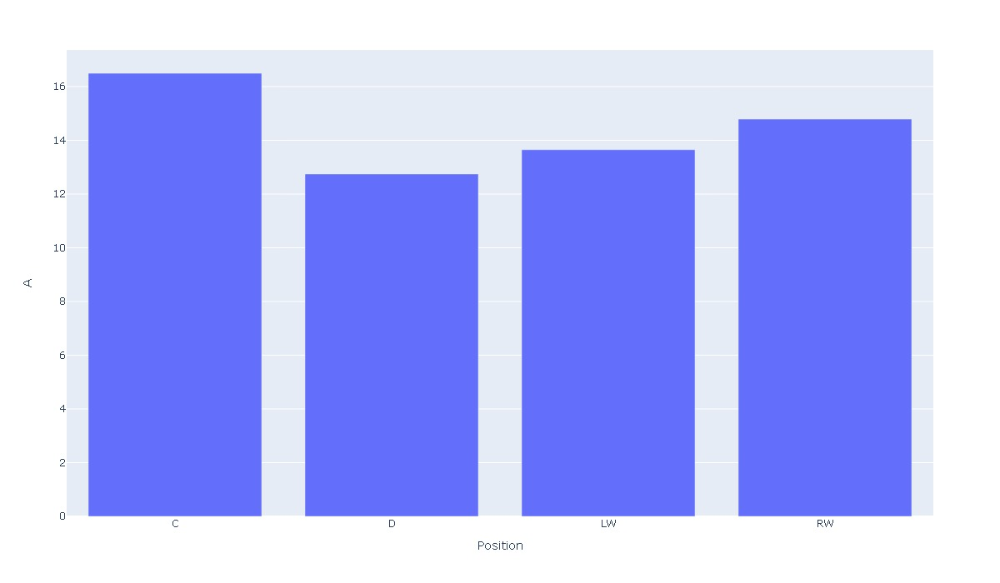

In [21]:
fig = px.bar(season18HCAgg, x='Position', y='A')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

A hockey team is built with four forward lines comprising of a Left Wing, Center, and a Right Wing; 3 lines of two defensemen; 1 goalie and 1 back up goalie. The nature of this means that Goalies play the most, defensmen play the second most, and forwards play the 3rd most on average in a game. This difference is very well explained in the following graph and the similarities between playing time for C, LW, RW make sense. I would assume that the higher TOI/GP for centers is a result of penalty kill situations. Penalty kills are situations where your team is penalized resulting in having one less player on the ice. Typically this situation requires more uses of centers since they, typically, are the "expert" faceoff personel and high end centers are, also, more defensively responsible.

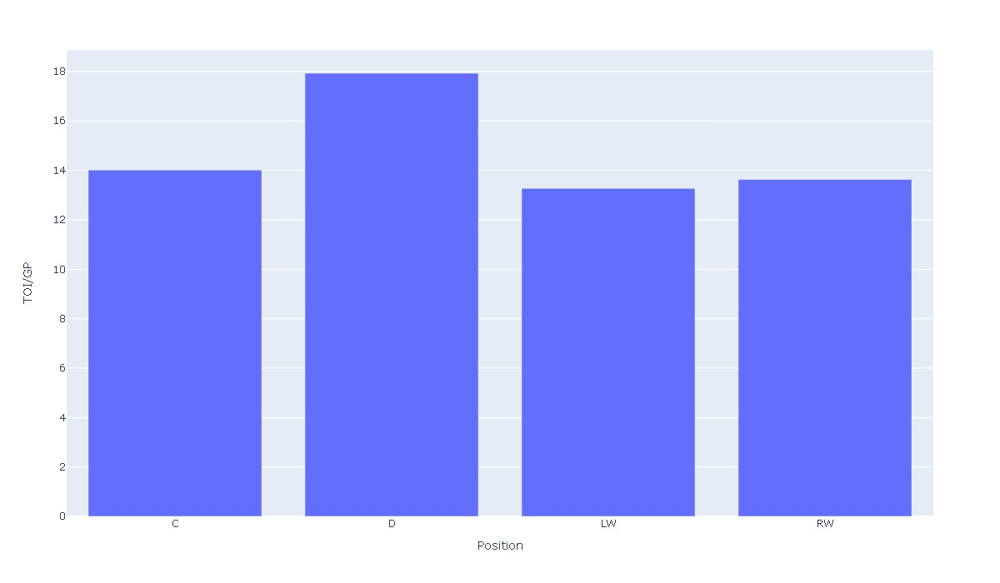

In [22]:
fig = px.bar(season18HCAgg, x='Position', y='TOI/GP')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

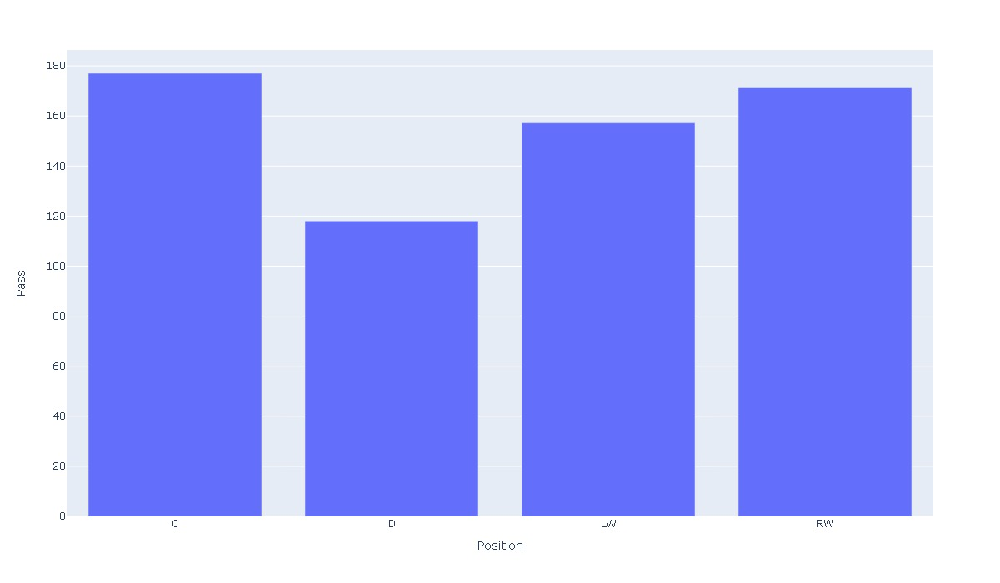

In [23]:
fig = px.bar(season18HCAgg, x='Position', y='Pass')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

I was expecting more of a gap when it ame to iCF; however, given the penalty kill situations I think this reversal in plots falls right in line with that. With a person down you do not expect to be outshooting your opponent and the lower time on ice per game seems to suggest that iCF and TOI/GP may be showing that unified penalty kill. More analysis will be needed to confirm this and that data is outside scope of this analysis.

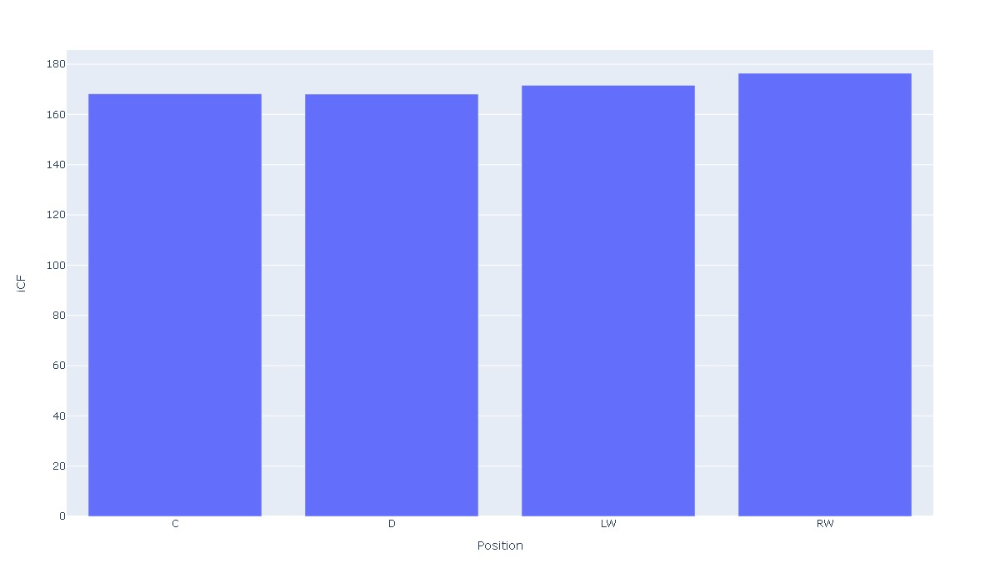

In [24]:
fig = px.bar(season18HCAgg, x='Position', y='iCF')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

iSCF is "individual score chance for" and being a defensemen compared to a forward easily explains this difference.

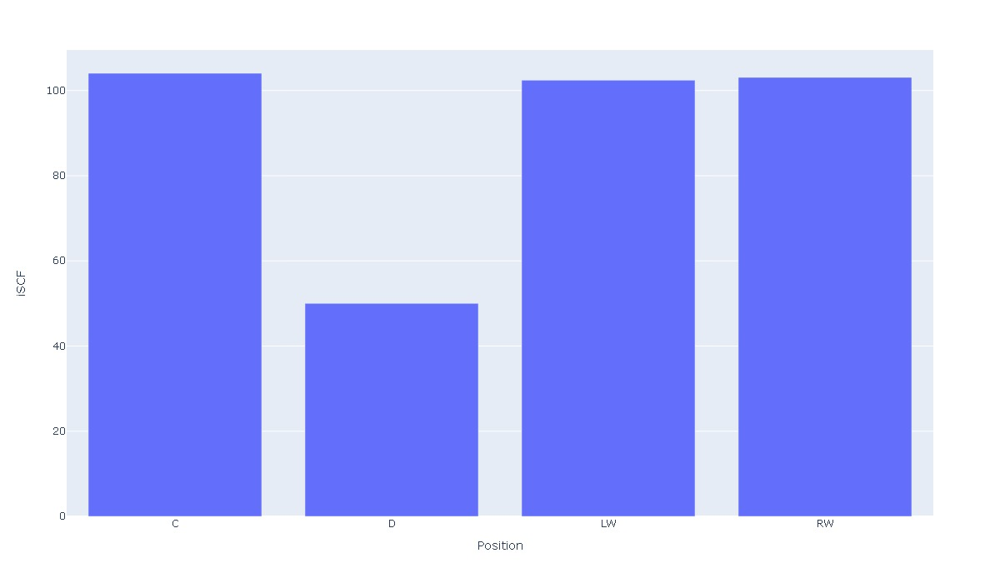

In [25]:
fig = px.bar(season18HCAgg, x='Position', y='iSCF')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

I did expect a biggere differnce in D compared to the forward positions when it came to age. It is a common ideology that defensemen and goalies take a longer time to develp then forwards do and the "jump" to the NHL is tougher on D since the game is faster and the players are stronger, both situations that can be hard on younger players. This ideology may need to be rethought after seeing this graph.

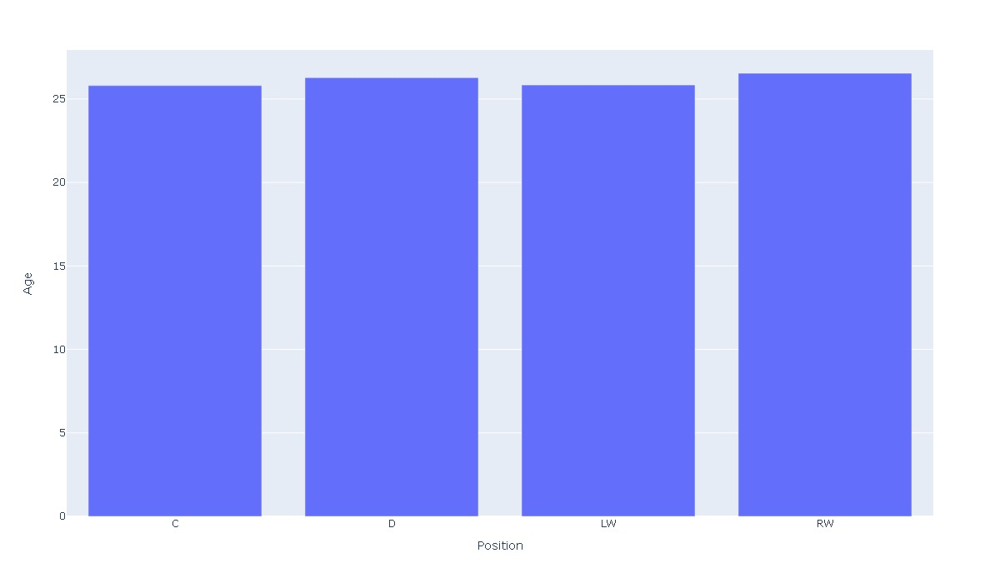

In [26]:
fig = px.bar(season18HCAgg, x='Position', y='Age')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

We see fairly strong coorelation between goal scoring, assists, and Cap hit in this graph. If we did a custering based on position I think we would see an even more obvious trend here as the names showing up toward the bottom right are all defensmen. This suggests that defensemen score less goals overall, but having a large amount of assists as a defensmen can still get you paid similar to forwards with similar assist numbers and higher goal totals.

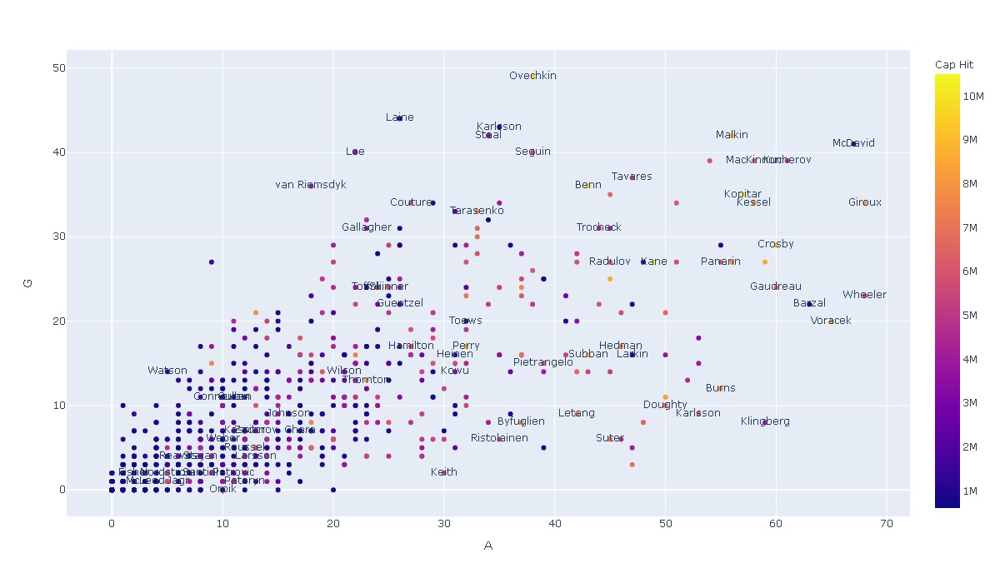

In [27]:

fig = px.scatter(season18HC, x='A',
    y='G',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Here we see how the CBA holds down players like Laine and McDavid from really getting what they deserve in Cap Hit. Both these players are near the top in goals scored; however, they are on entry level contracts which limits how much they can be compensated (both blue so being under paid).

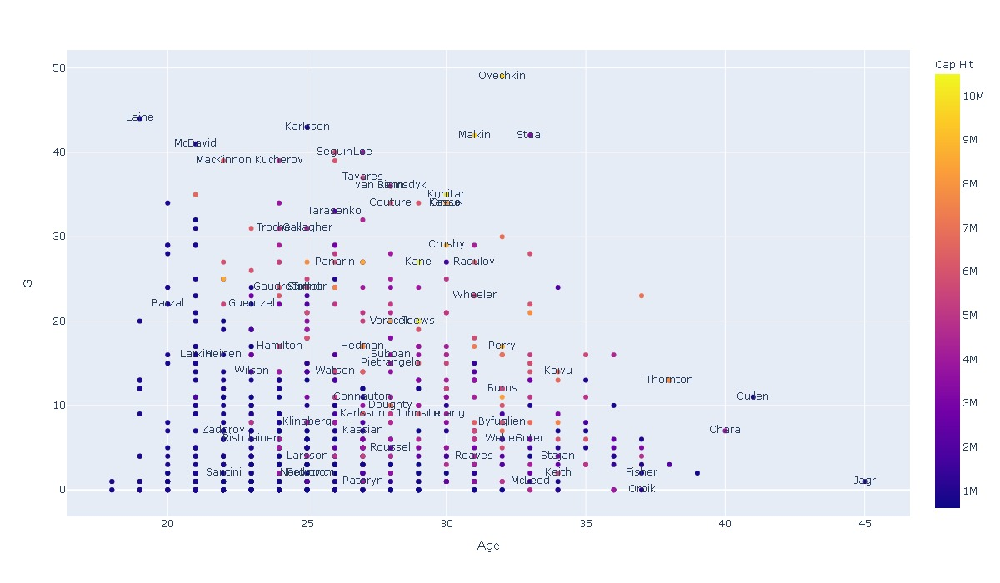

In [28]:
fig = px.scatter(season18HC, x='Age',
    y='G',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Seeing a that as goals increase so did scoring chances for the player is not surprising. I think the interesting part here is seeing who is best at created scoring chances for themselves (Ovechkin, Seguin, Mcdavid, Tarasenko) and who is best at converting on those scoring chances (Giroux, Stall, Malkin) or not good at converting (Skinner).

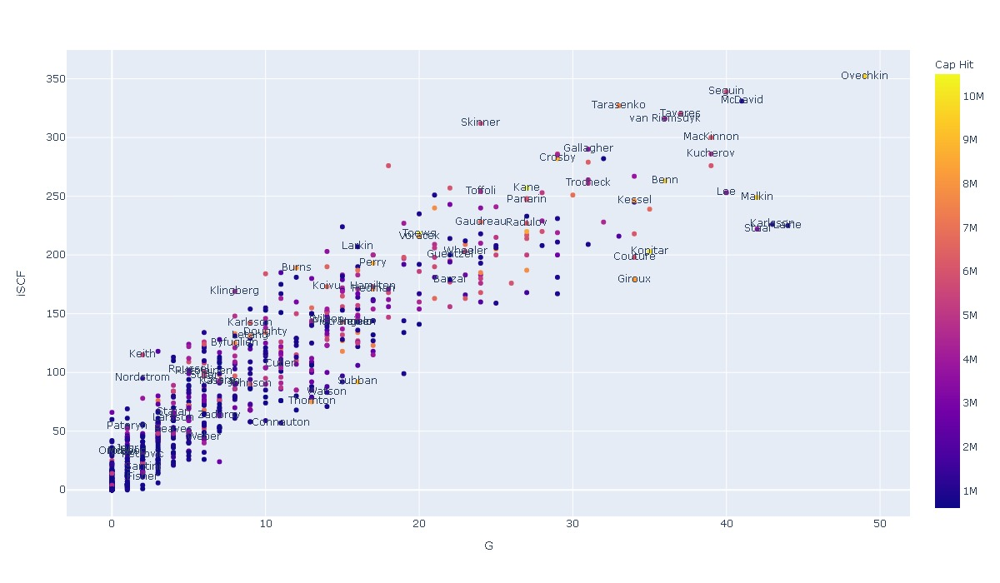

In [29]:
fig = px.scatter(season18HC, x='G',
    y='iSCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Assists follows the same trojectory as goals when compared to age.

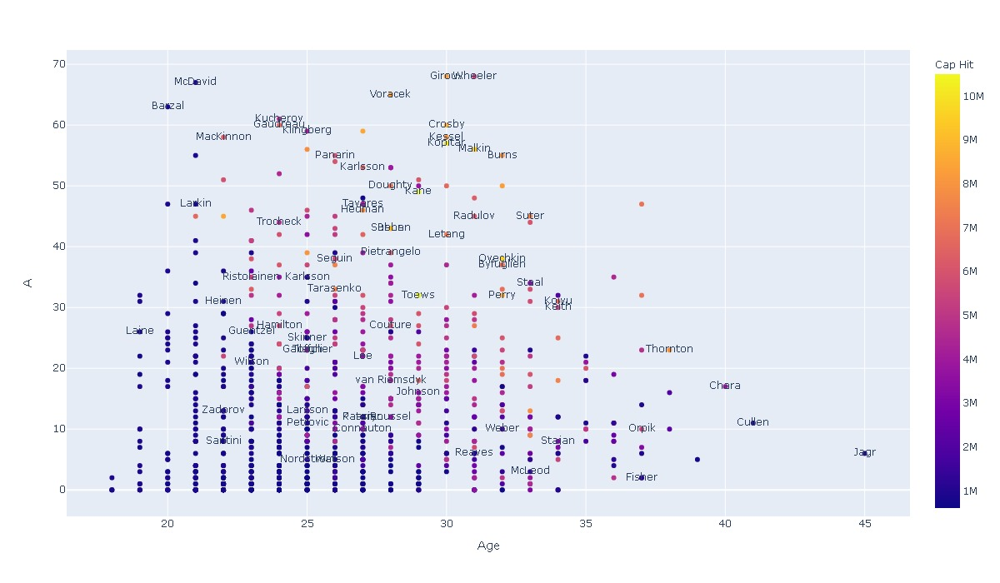

In [30]:
fig = px.scatter(season18HC, x='Age',
    y='A',text='Last Name',color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

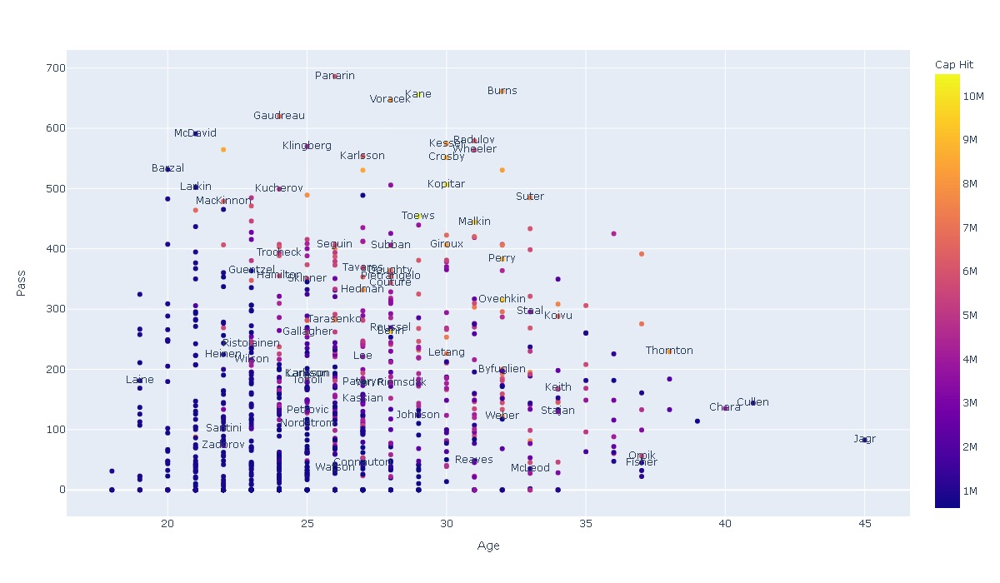

In [31]:
fig = px.scatter(season18HC, x='Age',
    y='Pass',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

More passing should lead to more assists, just the nature of assists; however, its the deeper interactions that become more interesting. Who needs to pass the most to get those assists and is it because your surrounded by less talented indivduals (Panarin) or because your passes are  not as dangerous (Burns)? Are the ones converting at a much higher rate because of their dangerous teammates (Letang) or because of their dangerous passes (Giroux)? These can be decifered using advanced analytics that are outside the scope of this paper; however, it is interesting to see the differences. My naming of players in () is my opinion prior to exploration based on my own hockey knowledge and should be used as potential examples opposed to fact driven analysis.

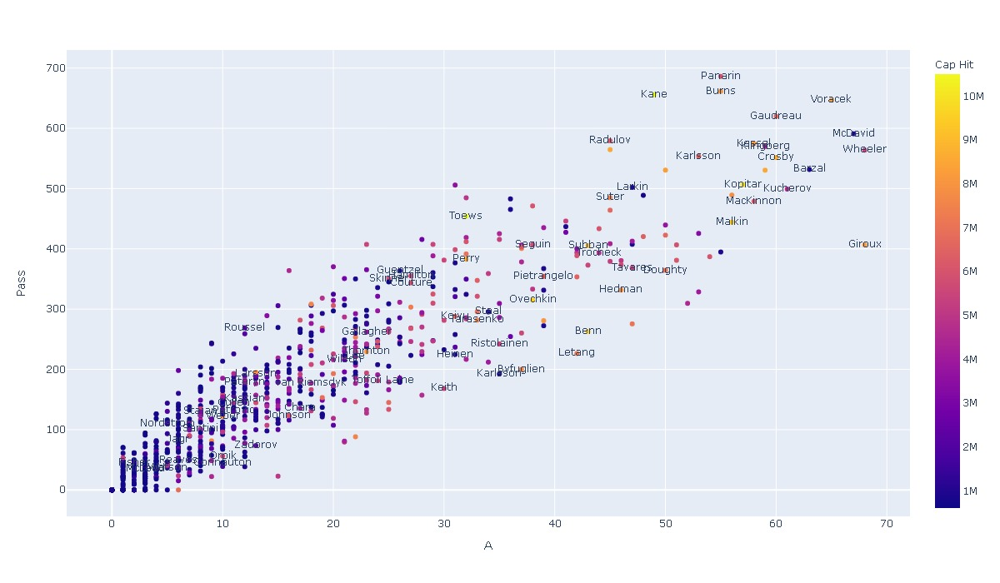

In [32]:
fig = px.scatter(season18HC, x='A',
    y='Pass',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

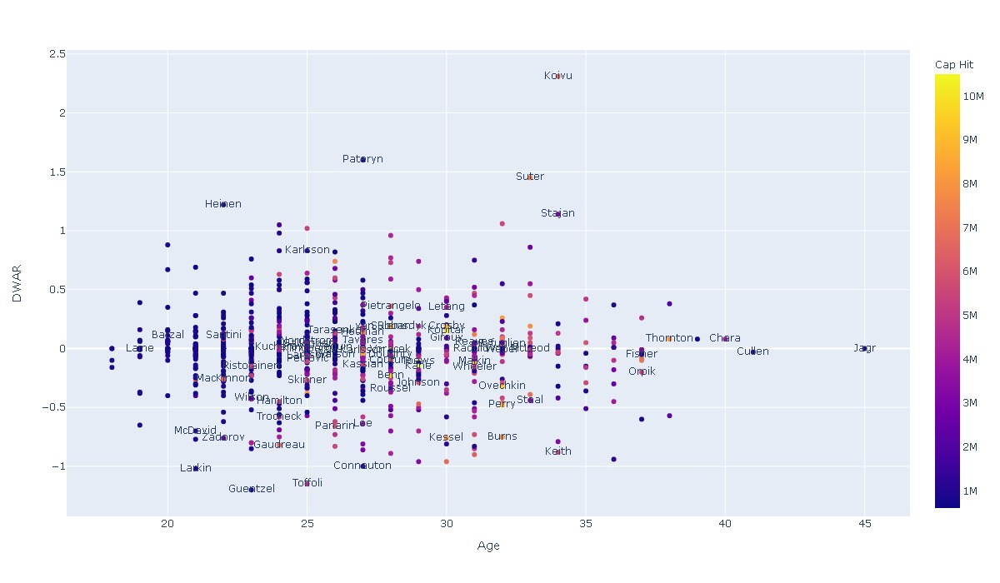

In [33]:
fig = px.scatter(season18HC, x='Age',
    y='DWAR',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

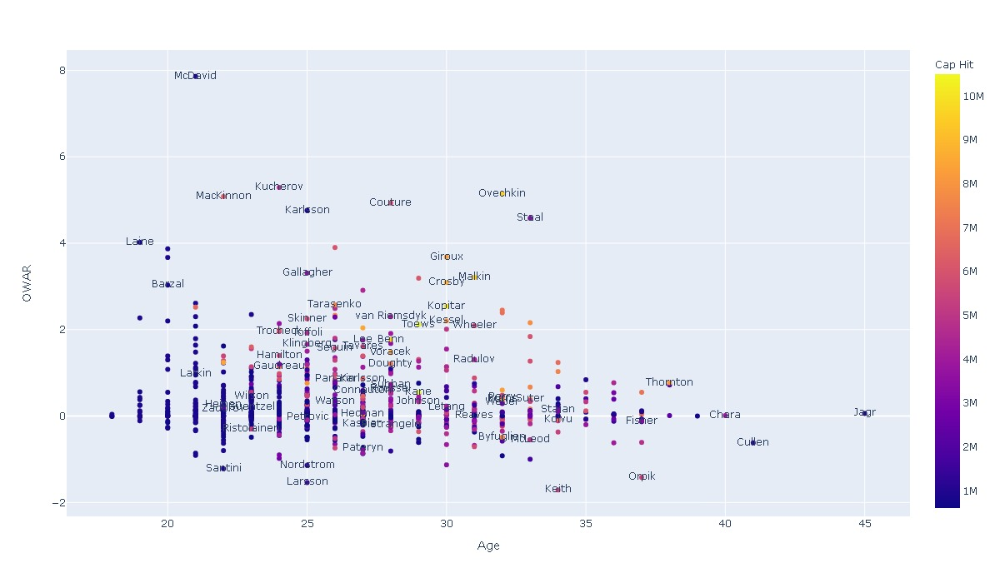

In [34]:
fig = px.scatter(season18HC, x='Age',
    y='OWAR',text='Last Name', color='Cap Hit')
fig.show()

image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

We can see here that the DWAR doesn't seperate most players from the pack; however, it may be useful when running the model for a handful of players that may specialize more in defense (Koivu).

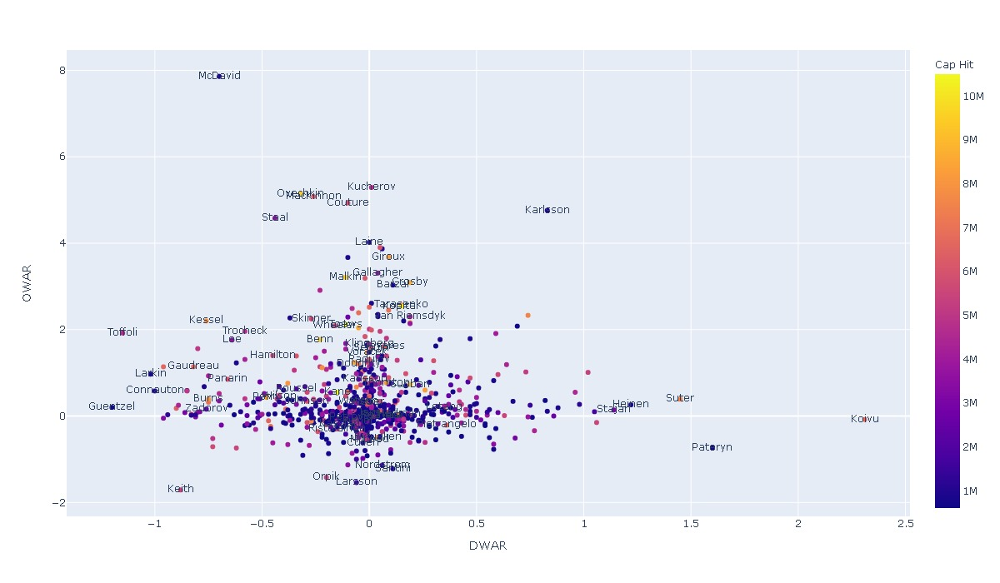

In [35]:
fig = px.scatter(season18HC, x='DWAR',
    y='OWAR',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

After graphing with color representing position and dot size being Cap Hit we see that DWAR a really hard metric to be positive in even for defensemen. This could help the model really cherry pick better performers.

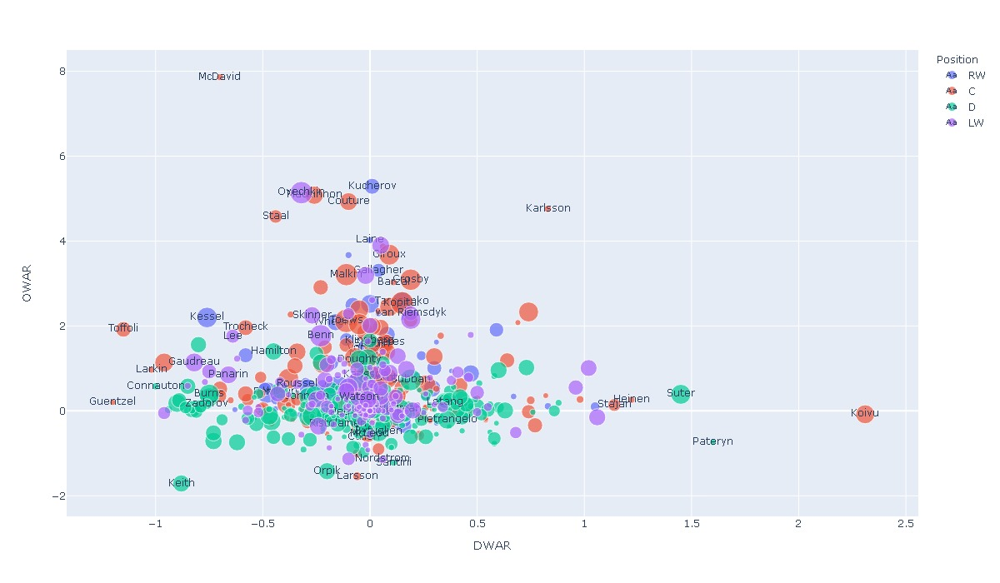

In [36]:
fig = px.scatter(season18HC, x='DWAR',
    y='OWAR', size='Cap Hit',text='Last Name', color='Position')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

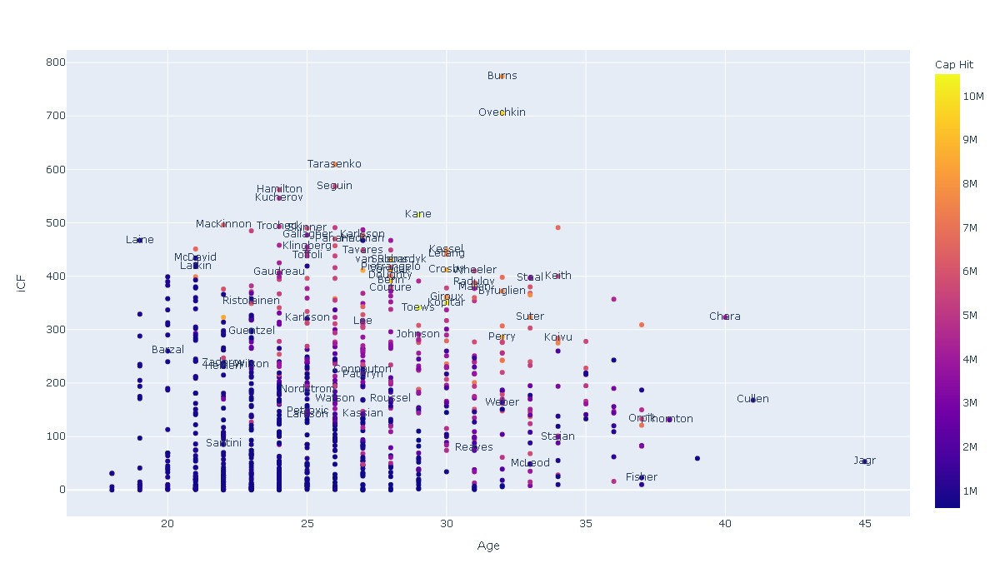

In [37]:
fig = px.scatter(season18HC, x='Age',
    y='iCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Indivdual corse for (iCF) and goals should be coorilated since it is a measure of shots taken while on the ice. We see here there a higher cap hit is follows this correlation some what, but if you score less then 10 goals and do not have the best corsi for you can still have a relatively high cap hit. This is intersting; however, we do expect defensemen to have lower goal totals so this may not be the whole picture and we should look at assists and positions.

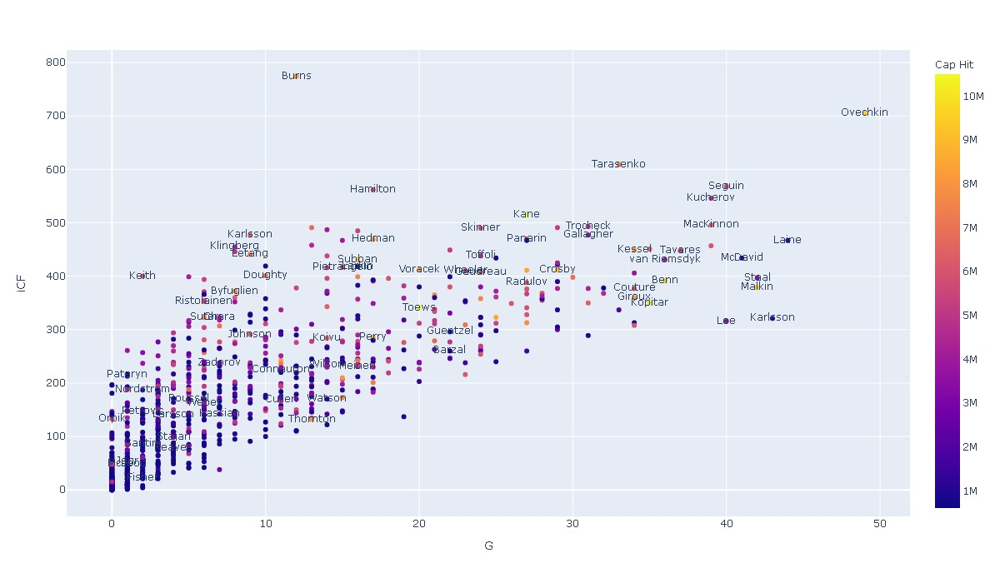

In [38]:
fig = px.scatter(season18HC, x='G',
    y='iCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Here we have the same plot as above; however, Cap Hit is represented by the size of the dot and the color is associated with position. Here it becomes obvious that the lower farther left and top portion of the graph is dominated by defensemen as we expect. In addition, the higher cap hits that were confusing on the last graph are clearly shown to be defensemen that we don't expect to have large goal totals, but want to have solid posession numbers.

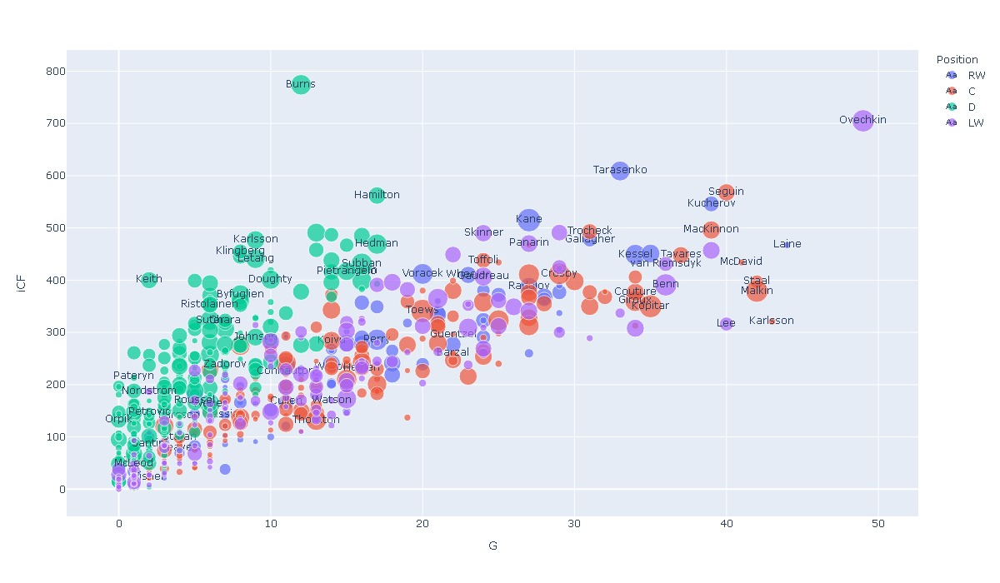

In [39]:
fig = px.scatter(season18HC, x='G',
    y='iCF', size='Cap Hit',text='Last Name', color='Position')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Similar to the goals results from above showing a correlation between posession metrics (iCF,iSCF) and production metrics (G,A).

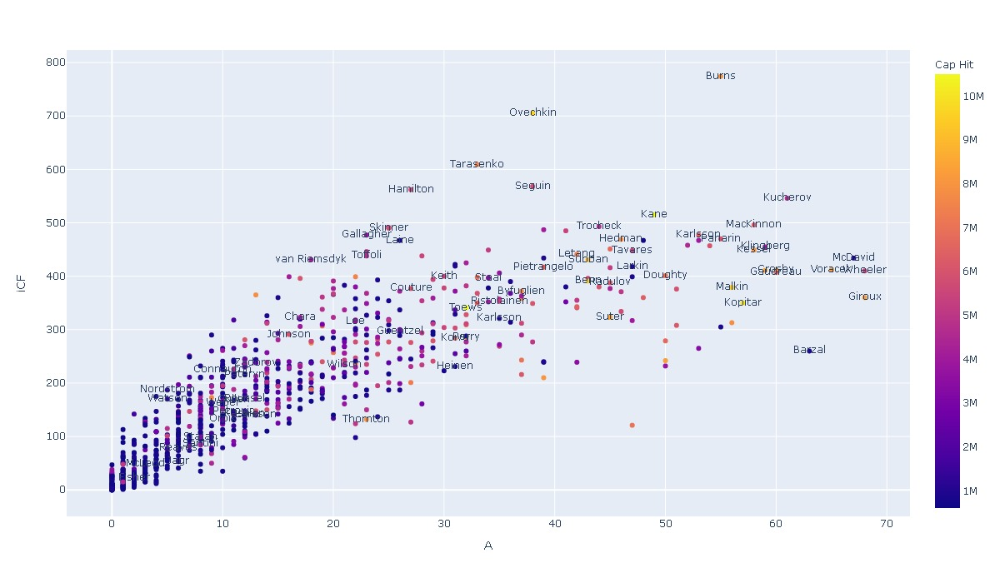

In [40]:
fig = px.scatter(season18HC, x='A',
    y='iCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Similar to the analgous goal's graph above.

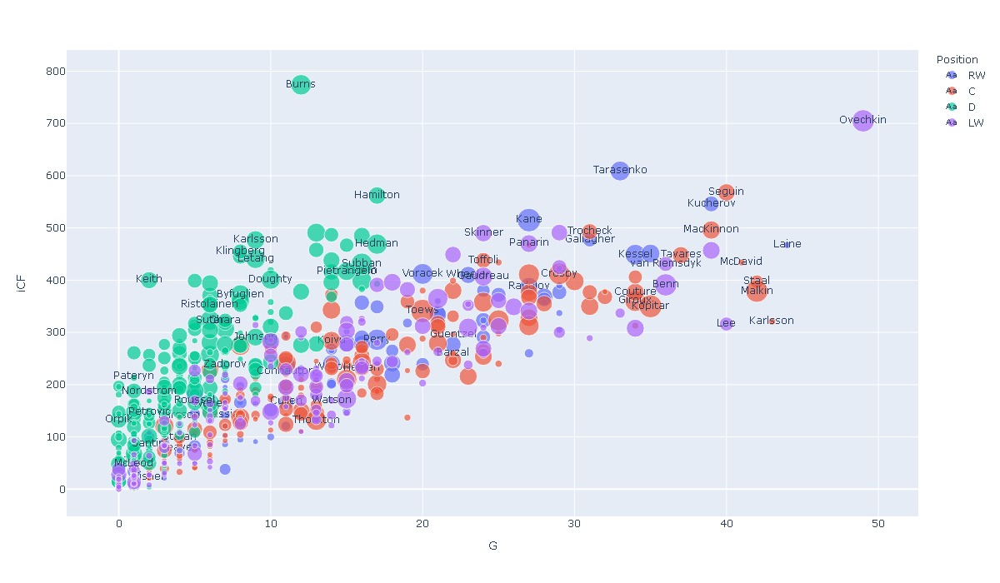

In [41]:
fig = px.scatter(season18HC, x='G',
    y='iCF', size='Cap Hit',text='Last Name', color='Position')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

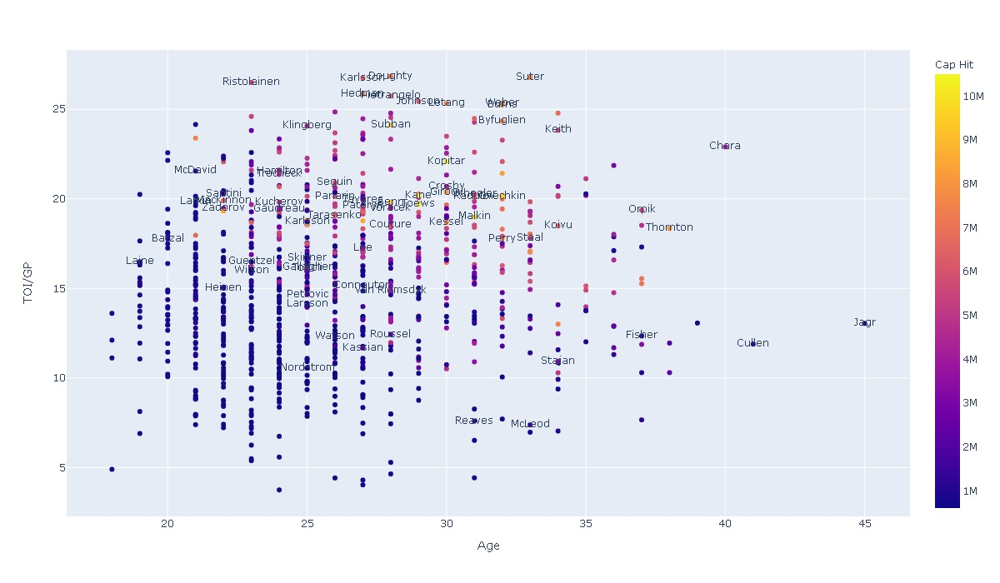

In [42]:
fig = px.scatter(season18HC, x='Age',
    y='TOI/GP',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

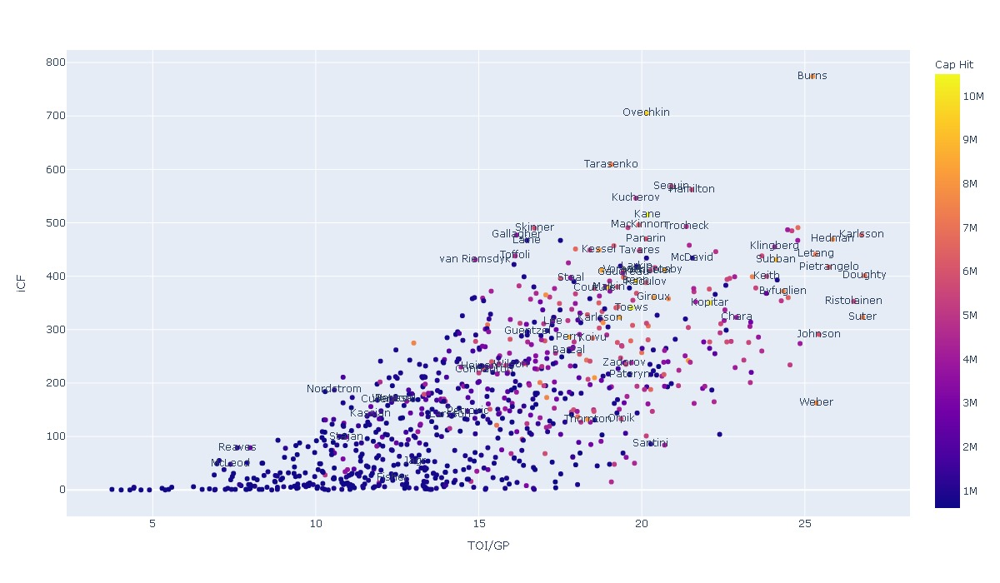

In [43]:
fig = px.scatter(season18HC, x='TOI/GP',
    y='iCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

As expected the more TOI/GP players are defensemen and they dominate the right side of this graph while the forwards dominating the top portion of this graph is probably a result of the power play (the team opposite of the penalty kill reference above). Looking at Burns in this graph brings in a much different view as on previous graphs he looked out of place compared to his peers; however, it is clear that his team has control often while he is on the ice compared to his peers and he does it while logging some of the most minutes in the league.

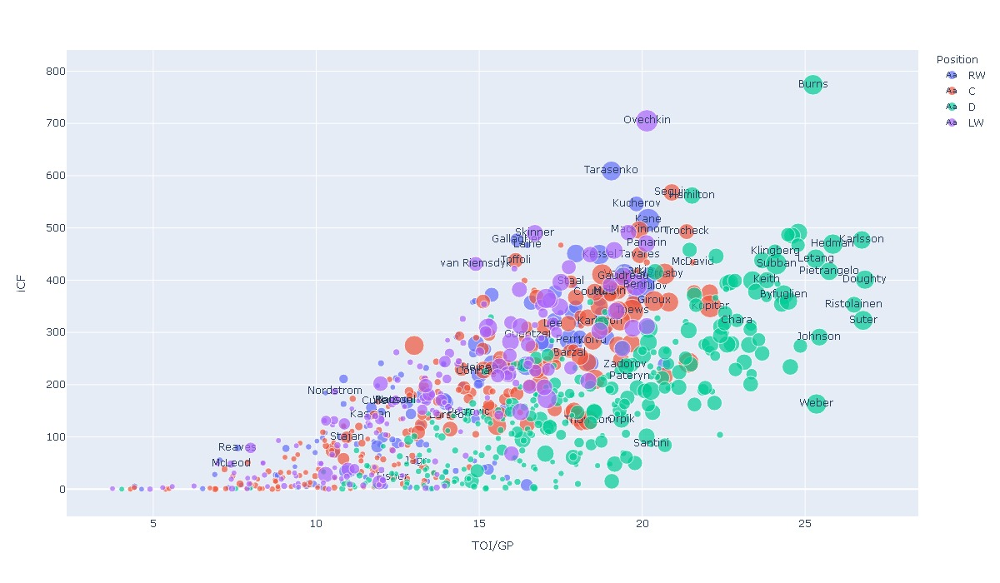

In [44]:
fig = px.scatter(season18HC, x='TOI/GP',
    y='iCF', size='Cap Hit',text='Last Name', color='Position')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

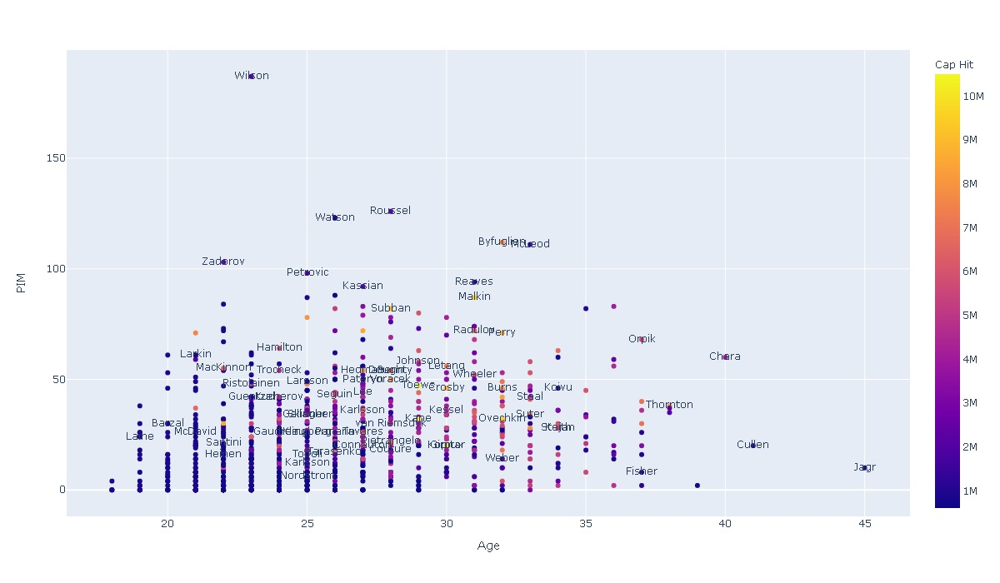

In [45]:
fig = px.scatter(season18HC, x='Age',
    y='PIM',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Extremely high penalty minutes typically result in less Cap Hit which is to be expected because these guys are probably more fighters then scorers.

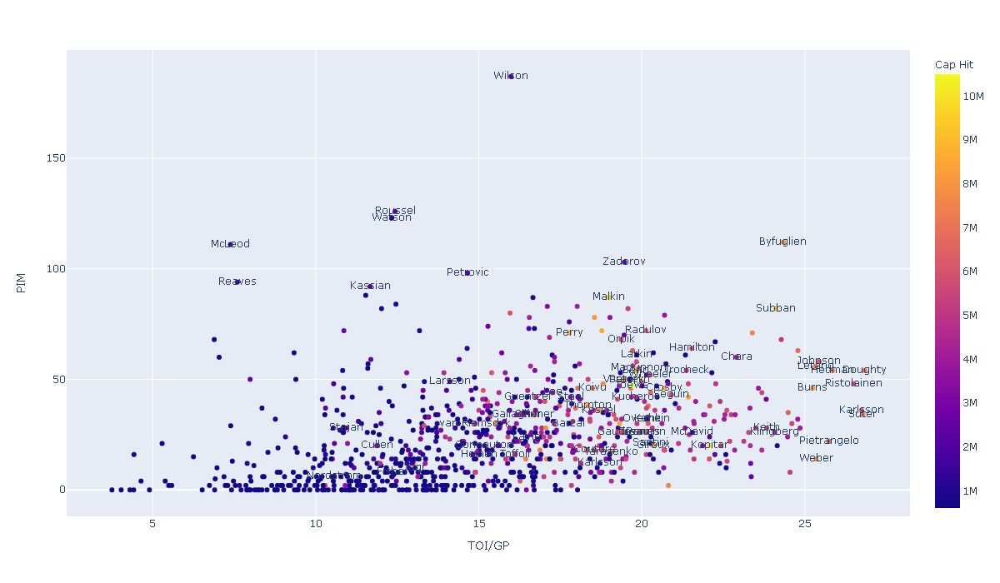

In [46]:
fig = px.scatter(season18HC, x='TOI/GP',
    y='PIM',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Individuals that have the most seasons for their age up until about 35 seems to be paid the best. These are probably the best players that entered the league immediatly so it would make sense that they have a bigger impact on the Cap Hit as they age and gain experience.

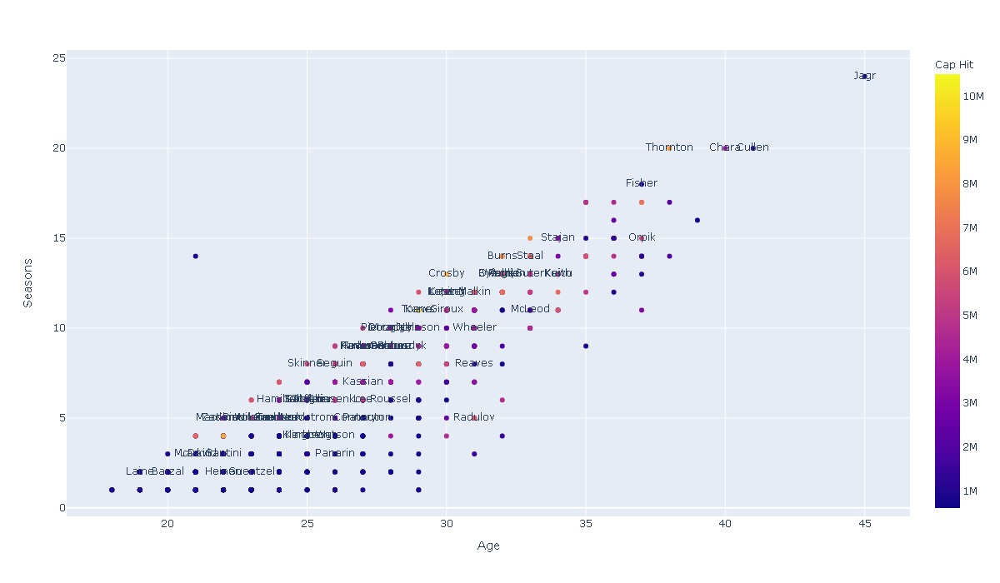

In [47]:
fig = px.scatter(season18HC, x='Age',
    y='Seasons',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

There is a clear association with an increase in seasons resulting in more pay. This is another example of the CBA artifically influencing the market for younger players.

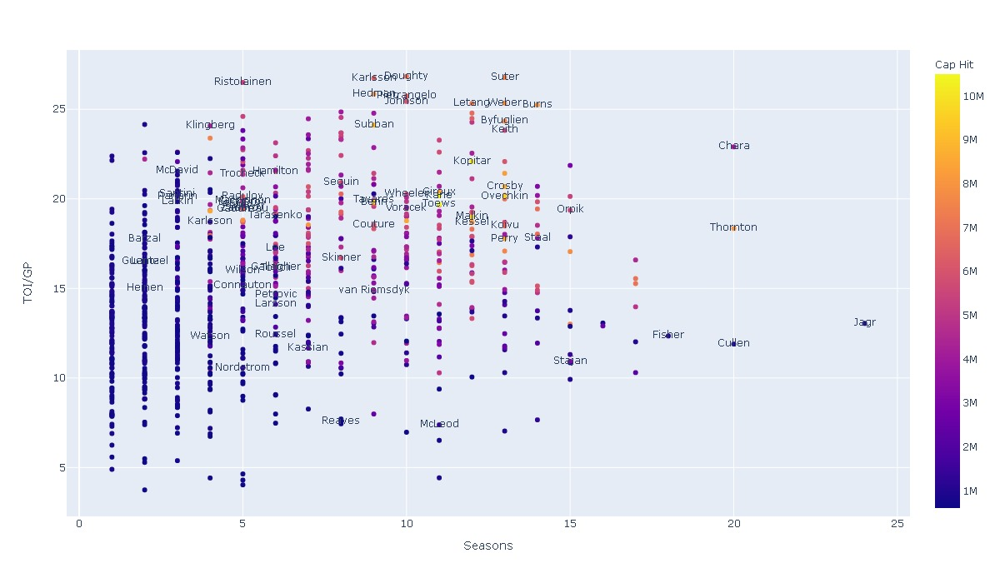

In [48]:
fig = px.scatter(season18HC, x='Seasons',
    y='TOI/GP',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

In [49]:
season18HC.head()

,Last Name,Age,Seasons,Position,GP,G,A,PIM,TOI/GP,iCF,iSCF,Pass,OWAR,DWAR,Cap Hit
0,,28,7,RW,33,3,6,6,11.927778,64,42,71.5,-0.06,-0.16,700000.0
1,,30,4,C,62,3,5,14,10.514516,74,41,38.9,-0.41,-0.05,4700000.0
2,,27,7,D,82,3,7,28,16.747154,251,57,113.3,0.17,-0.02,3500000.0
3,,35,17,LW,62,13,11,82,12.018011,133,79,181.6,0.84,-0.15,1000000.0
4,,36,15,D,80,4,19,20,21.864792,190,53,148.8,0.54,-0.18,3000000.0


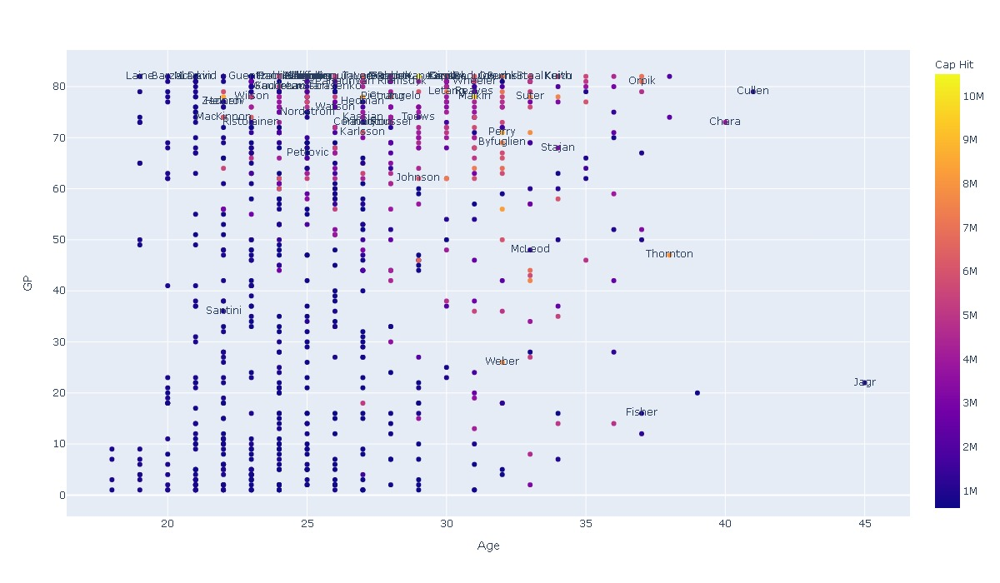

In [50]:
fig = px.scatter(season18HC, x='Age',
    y='GP',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Realy neat to see the steady rise of TOI/GP for players that play more games. This shows how important experience is within the NHL.

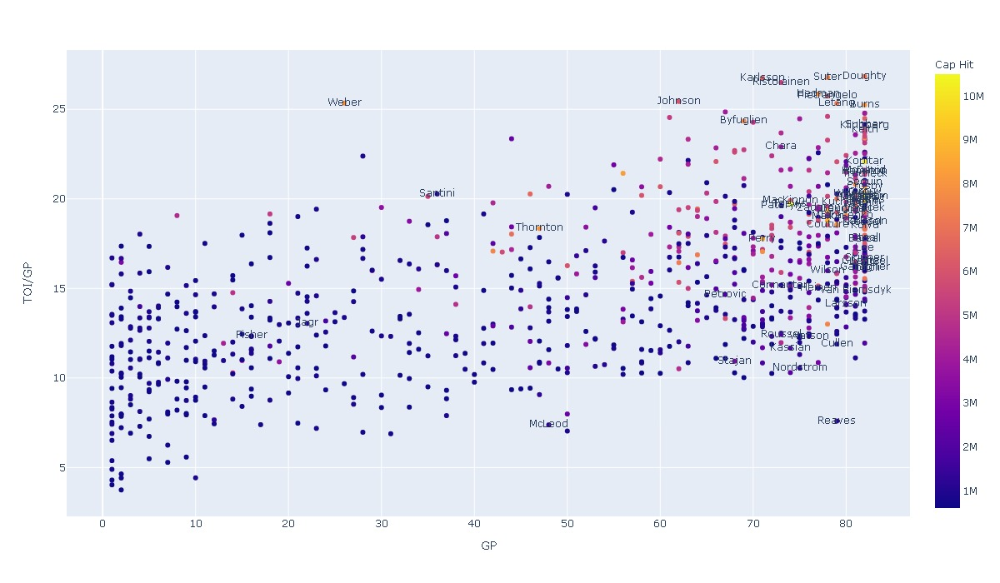

In [51]:
fig = px.scatter(season18HC, x='GP',
    y='TOI/GP',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

In [52]:
X=season18Less[season18Less.columns[:-1]]
y=season18Less['Cap Hit']

In [53]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 0)

# Modeling

## SVR: Training, CV, and Predicting
Support Vector Regression uses svm theory applied to regression to fit models. This means that we can control how much error is present in our outcome. This gives us incredible control over the model which means we need to tune the model carefully. In python the standard way to tune parameters is through the GridSearchCV function found within the sklearn.model_selection package. With some exploration this package suggested that we use a C of 9900 and a Gamma of 1e-13.

In [95]:
model = svm.SVR()
print(model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test)))
predictions=model.predict(X_test)

-0.4255298429995584


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



In [96]:
from sklearn.model_selection import GridSearchCV 
param_grid = {'C': np.arange(9000, 10000, 100).tolist(),  
              'gamma': [pow(10,-9),pow(10,-10),pow(10,-11),pow(10,-12),pow(10,-13),pow(10,-14),pow(10,-15)], 
              'kernel': ['rbf']}
model = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3) 
model.fit(X_train, y_train) 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Fitting 3 folds for each of 70 candidates, totalling 210 fits
[CV] C=9000, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9000, gamma=1e-09, kernel=rbf, score=-0.327, total=   0.0s
[CV] C=9000, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9000, gamma=1e-09, kernel=rbf, score=-0.257, total=   0.0s
[CV] C=9000, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9000, gamma=1e-09, kernel=rbf, score=-0.274, total=   0.0s
[CV] C=9000, gamma=1e-10, kernel=rbf .................................
[CV] .... C=9000, gamma=1e-10, kernel=rbf, score=-0.149, total=   0.0s
[CV] C=9000, gamma=1e-10, kernel=rbf .................................
[CV] .... C=9000, gamma=1e-10, kernel=rbf, score=-0.078, total=   0.0s
[CV] C=9000, gamma=1e-10, kernel=rbf .................................
[CV] .... C=9000, gamma=1e-10, kernel=rbf, score=-0.083, total=   0.0s
[CV] C=9000, gamma=1e-11, kernel=rbf .................................
[CV] ..... C=90

[CV] .... C=9200, gamma=1e-14, kernel=rbf, score=-0.118, total=   0.0s
[CV] C=9200, gamma=1e-15, kernel=rbf .................................
[CV] .... C=9200, gamma=1e-15, kernel=rbf, score=-0.416, total=   0.0s
[CV] C=9200, gamma=1e-15, kernel=rbf .................................
[CV] .... C=9200, gamma=1e-15, kernel=rbf, score=-0.335, total=   0.0s
[CV] C=9200, gamma=1e-15, kernel=rbf .................................
[CV] .... C=9200, gamma=1e-15, kernel=rbf, score=-0.378, total=   0.0s
[CV] C=9300, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9300, gamma=1e-09, kernel=rbf, score=-0.323, total=   0.0s
[CV] C=9300, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9300, gamma=1e-09, kernel=rbf, score=-0.253, total=   0.0s
[CV] C=9300, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9300, gamma=1e-09, kernel=rbf, score=-0.268, total=   0.0s
[CV] C=9300, gamma=1e-10, kernel=rbf .................................
[CV] .

[CV] .... C=9500, gamma=1e-15, kernel=rbf, score=-0.376, total=   0.0s
[CV] C=9600, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9600, gamma=1e-09, kernel=rbf, score=-0.319, total=   0.0s
[CV] C=9600, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9600, gamma=1e-09, kernel=rbf, score=-0.249, total=   0.0s
[CV] C=9600, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9600, gamma=1e-09, kernel=rbf, score=-0.262, total=   0.0s
[CV] C=9600, gamma=1e-10, kernel=rbf .................................
[CV] .... C=9600, gamma=1e-10, kernel=rbf, score=-0.131, total=   0.0s
[CV] C=9600, gamma=1e-10, kernel=rbf .................................
[CV] .... C=9600, gamma=1e-10, kernel=rbf, score=-0.061, total=   0.0s
[CV] C=9600, gamma=1e-10, kernel=rbf .................................
[CV] .... C=9600, gamma=1e-10, kernel=rbf, score=-0.063, total=   0.0s
[CV] C=9600, gamma=1e-11, kernel=rbf .................................
[CV] .

[CV] .... C=9800, gamma=1e-14, kernel=rbf, score=-0.100, total=   0.0s
[CV] C=9800, gamma=1e-15, kernel=rbf .................................
[CV] .... C=9800, gamma=1e-15, kernel=rbf, score=-0.413, total=   0.0s
[CV] C=9800, gamma=1e-15, kernel=rbf .................................
[CV] .... C=9800, gamma=1e-15, kernel=rbf, score=-0.333, total=   0.0s
[CV] C=9800, gamma=1e-15, kernel=rbf .................................
[CV] .... C=9800, gamma=1e-15, kernel=rbf, score=-0.375, total=   0.0s
[CV] C=9900, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9900, gamma=1e-09, kernel=rbf, score=-0.315, total=   0.0s
[CV] C=9900, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9900, gamma=1e-09, kernel=rbf, score=-0.244, total=   0.0s
[CV] C=9900, gamma=1e-09, kernel=rbf .................................
[CV] .... C=9900, gamma=1e-09, kernel=rbf, score=-0.257, total=   0.0s
[CV] C=9900, gamma=1e-10, kernel=rbf .................................
[CV] .

[Parallel(n_jobs=1)]: Done 210 out of 210 | elapsed:    3.3s finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='auto_deprecated', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [9000, 9100, 9200, 9300, 9400, 9500, 9600, 9700,
                               9800, 9900],
                         'gamma': [1e-09, 1e-10, 1e-11, 1e-12, 1e-13, 1e-14,
                                   1e-15],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [97]:
model.best_estimator_.get_params()

{'C': 9900,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'epsilon': 0.1,
 'gamma': 1e-13,
 'kernel': 'rbf',
 'max_iter': -1,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

In [98]:
model = svm.SVR(C= 9900,
 cache_size= 200,
 coef0= 0.0,
 degree= 3,
 epsilon= 0.1,
 gamma= 1e-13,
 kernel= 'rbf',
 max_iter= -1,
 shrinking= True,
 tol= 0.001,
 verbose= False)
model.fit(X_train, y_train) 

SVR(C=9900, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=1e-13,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

Here we see that even with our tunning that the model performs very poorly. Even with allowing an epsilon of 300,000 the model did not perform well. It was worth trying so we could dictate how much error we could have. It appears this model needs more tunning; however, given the long times it takes to run the GridSearchCV function and given the performance of the other models this was not continued. 

In [99]:
model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test))
predictions=model.predict(X_test)
print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
cvScore=cross_val_score(model,X_test,y_test)
print('Cross validation score: [%.3f,%.3f,%.3f]'% (cvScore[0],cvScore[1],cvScore[2]))
print('R2 score: %.3f'% r2_score(y_test, predictions))
print('MSE: %.3f'% mean_squared_error(y_test, predictions))
stdv=np.sqrt(sum(((model.predict(X_test)) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval constant: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])

Percent of variance Explained: 0.761
Cross validation score: [0.602,0.609,0.672]
R2 score: 0.729
MSE: 1283785800780.816
Prediction Interval constant: 2223402.782
95% likelihood that the true value is between -1412531.394 and 3034274.170
Predicted value: 810871.388
True value: 700000.000


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



We see that some more tuning needs to be done with this model; however, given the time it takes to get that model and given the accuracy of the following models it was decided that tuning this model was not cost effective.

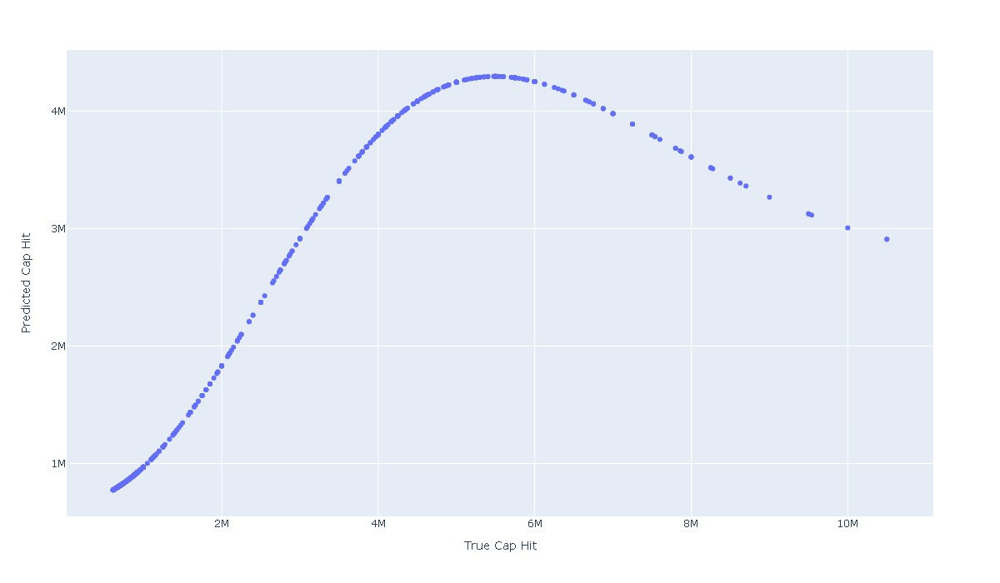

In [100]:
ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

## PCA and Decision Trees
Using pipline these two models were able to run at the same time and GridSearchCV was able to be applied using just one call to both. GridSearchCV was used to find the number of components for PCA while it was used on the criterion and max depth for the decision tree regression model.

In [60]:
std_slc = StandardScaler()
pca = decomposition.PCA()
dec_tree = tree.DecisionTreeRegressor()
svr = svm.SVR()

In [61]:
pipe = Pipeline(steps=[('std_slc', std_slc),
                           ('pca', pca),
                           ('dec_tree', dec_tree)])

In [62]:
n_components = list(range(1,X.shape[1]+1,1))
criterion = ['mse', 'friedman_mse', 'mae']
max_depth = [12,14,16,18,20,22,24,26,28,30]

parameters = dict(pca__n_components=n_components,
                      dec_tree__criterion=criterion,
                      dec_tree__max_depth=max_depth)
clf_GS = GridSearchCV(pipe, parameters)
clf_GS.fit(X, y)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('std_slc',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=None,
                                            random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('dec_tree',
                                        DecisionTreeRegressor(criterion='mse',
                                                              max_depth=None,
                                              

In [63]:
print('Best Criterion:', clf_GS.best_estimator_.get_params()['dec_tree__criterion'])
print('Best max_depth:', clf_GS.best_estimator_.get_params()['dec_tree__max_depth'])
print('Best Number Of Components:', clf_GS.best_estimator_.get_params()['pca__n_components'])
print(); print(clf_GS.best_estimator_.get_params()['dec_tree'])
print(); print(clf_GS.best_estimator_.get_params()['pca'])
print(); print(clf_GS.best_estimator_.get_params()['std_slc'])

Best Criterion: mse
Best max_depth: 16
Best Number Of Components: 9

DecisionTreeRegressor(criterion='mse', max_depth=16, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

PCA(copy=True, iterated_power='auto', n_components=9, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

StandardScaler(copy=True, with_mean=True, with_std=True)


### Decision Tree Regressor
In a Decision Tree Regressor we build a tree with weights such that at the end of the decisions we get a set value. The shape and execution of the decision tree for regression looks similar to classification, but with a deciding number instead of a catagorical one. We see that decision tree yeilded a prediction interval constant of `$`102,082. This is a very acceptable range and we can see from the example prediction that our prediction is actually exactly correct. In addition we have  99.9\% of variance explained by the model with an $R^2$ term of 99.9\% as well. This is a very good model that was developed with cross validation and our cross validtion scores are very close to the same.

In [64]:
model=DecisionTreeRegressor(criterion='mae', max_depth=24, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [65]:
model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test))
predictions=model.predict(X_test)
print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
cvScore=cross_val_score(model,X_test,y_test)
print('Cross validation score: [%.3f,%.3f,%.3f]'% (cvScore[0],cvScore[1],cvScore[2]))
print('R2 score: %.3f'% r2_score(y_test, predictions))
print('MSE: %.3f'% mean_squared_error(y_test, predictions))
stdv=np.sqrt(sum(((model.predict(X_test)) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval constant: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])


Percent of variance Explained: 1.000
Cross validation score: [0.885,0.993,0.986]
R2 score: 1.000
MSE: 2062985967.941
Prediction Interval constant: 89554.894
95% likelihood that the true value is between 5660445.106 and 5839554.894
Predicted value: 5750000.000
True value: 5750000.000


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



The predicted cap hit vs actual cap hit for decission trees shows a nearly perfect linear relationship with a suggestion that higher valued cap hits may be a bit harder for the model to capture. This aligns well with our above metrics that suggest strong approximations for the test data set.

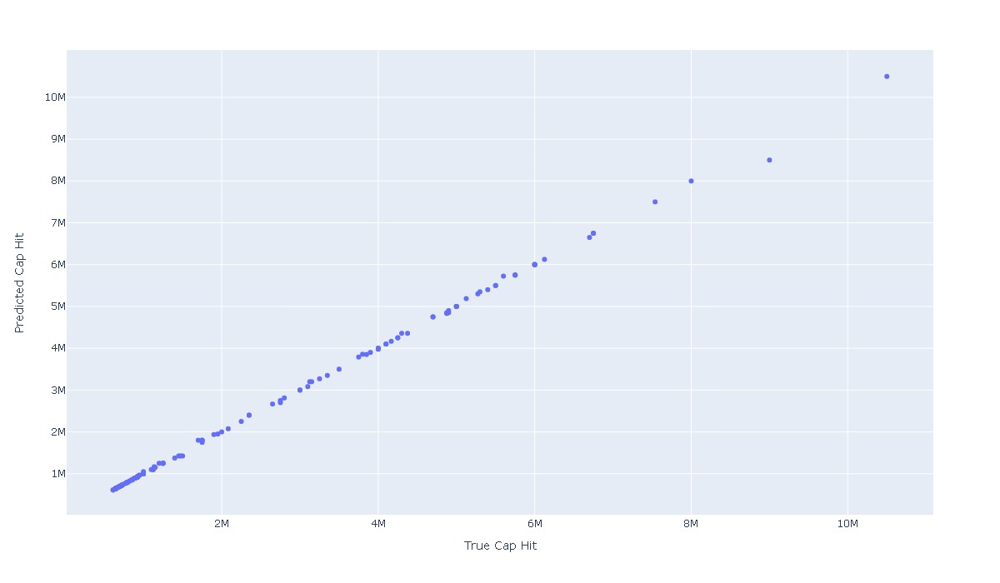

In [66]:
ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

In [67]:
from sklearn import tree
tree.plot_tree(model,max_depth=5,filled=True)

[Text(277.03125, 302.86285714285714, 'X[12] <= 2925000.0\nmae = 1577663.847\nsamples = 674\nvalue = 925000.0'),
 Text(140.0625, 256.2685714285715, 'X[12] <= 1500000.0\nmae = 302805.859\nsamples = 461\nvalue = 863333.0'),
 Text(72.0, 209.67428571428573, 'X[12] <= 796250.0\nmae = 124454.19\nsamples = 394\nvalue = 796250.0'),
 Text(36.0, 163.08, 'X[12] <= 688750.0\nmae = 37438.65\nsamples = 197\nvalue = 670000.0'),
 Text(18.0, 116.4857142857143, 'X[12] <= 664166.5\nmae = 10287.101\nsamples = 119\nvalue = 650000.0'),
 Text(9.0, 69.89142857142855, 'X[12] <= 630833.5\nmae = 6631.568\nsamples = 95\nvalue = 650000.0'),
 Text(4.5, 23.297142857142887, '\n  (...)  \n'),
 Text(13.5, 23.297142857142887, '\n  (...)  \n'),
 Text(27.0, 69.89142857142855, 'X[12] <= 671666.5\nmae = 3576.417\nsamples = 24\nvalue = 675000.0'),
 Text(22.5, 23.297142857142887, '\n  (...)  \n'),
 Text(31.5, 23.297142857142887, '\n  (...)  \n'),
 Text(54.0, 116.4857142857143, 'X[12] <= 726666.5\nmae = 22377.115\nsamples = 78\

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x000001E838B5AEE8> (for post_execute):


RuntimeError: dvipng was not able to process the following string:
b''

Here is the full report generated by dvipng:
C:\Users\User\.matplotlib\tex.cache\2a8d0fd5b7c2b13d144166c172b04ec1.dvi: No such file or directory
This is dvipng 1.16 Copyright 2002-2015, 2019 Jan-Ake Larsson




RuntimeError: dvipng was not able to process the following string:
b''

Here is the full report generated by dvipng:
C:\Users\User\.matplotlib\tex.cache\2a8d0fd5b7c2b13d144166c172b04ec1.dvi: No such file or directory
This is dvipng 1.16 Copyright 2002-2015, 2019 Jan-Ake Larsson




FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\User\\.matplotlib\\tex.cache\\2a8d0fd5b7c2b13d144166c172b04ec1.dvi'

<Figure size 720x432 with 1 Axes>

### PCA
PCA was originally chosen to help with feature reduction and selection. After several failed attempts at allowing different mothods automatically find the best feature selection I decided to hand pick what I thought was the best predictors. PCA was used now to see if there was good dimensional reduction that could occure on the smaller data set. It appears that PCA was not in favor of reducing the demensionallity of our variables farther beyond what we had already reduced it to. However, PCA performed too well to be reliable. Further data and testing will be needed to validate it as it performed almost perfect with a MSE of $2.7e-12$, an explained error of 100%, an $R^2$ of 1, a prediction interval length of 0 and a perfect estimation of values. This is clearly wrong and have reached out to the professor for assistance.

In [68]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_predict
pca=PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False).fit(X_train)
pcatrain_x = pca.transform(X_train)
pcatest_x = pca.transform(X_test)
reg = LinearRegression()
reg.fit(pcatrain_x, y_train)
predictions=reg.predict(pcatest_x)

#predictions=cross_val_predict(reg, pcatest_x, y_test, cv=10)

print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
cvScore=cross_val_score(reg,X_test,y_test)
print('Cross validation score: [%.3f,%.3f,%.3f]'% (cvScore[0],cvScore[1],cvScore[2]))
print('R2 score: %.3f'% r2_score(y_test, predictions))
print(mean_squared_error(y_test, predictions))
stdv=np.sqrt(sum(((reg.predict(pcatest_x)) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval length: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])

Percent of variance Explained: 1.000
Cross validation score: [1.000,1.000,1.000]
R2 score: 1.000
2.7046953617794442e-12
Prediction Interval length: 0.000
95% likelihood that the true value is between 5750000.000 and 5750000.000
Predicted value: 5750000.000
True value: 5750000.000


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



Literally cannot get better then this linear relationship, which suggests overfitting is at play. This will be revisted after consulting with the proffessor.

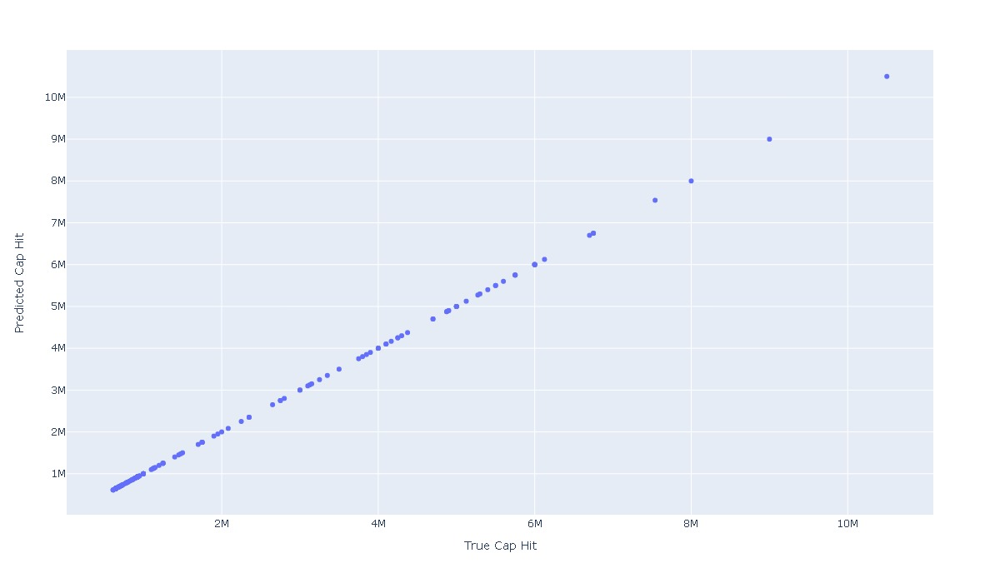

In [69]:
ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

## Boosting Set Up

Boosting finds its optimal point during the running of its function. There is some prepping of variables using the xgb.DMatrix function for both the $x$ and $y$ values; however, that is the extent of the required pre-processing.

In [70]:
import xgboost as xgb
dtrain=xgb.DMatrix(X_train,y_train)
dtest=xgb.DMatrix(X_test,y_test)
params={
    'objective':"reg:squarederror",
    'eval_metric':["rmse","mae"]
}
evallist=[(dtest,'eval'),(dtrain,'train')]

In [71]:
num_round = 1000
bst=xgb.train(params,dtrain, num_round, evallist,early_stopping_rounds=10)
predictions=bst.predict(dtest,ntree_limit=bst.best_ntree_limit)

[0]	eval-rmse:2257092.75000	eval-mae:1668775.62500	train-rmse:2276788.00000	train-mae:1653461.12500
Multiple eval metrics have been passed: 'train-mae' will be used for early stopping.

Will train until train-mae hasn't improved in 10 rounds.
[1]	eval-rmse:1617080.62500	eval-mae:1183295.12500	train-rmse:1616696.37500	train-mae:1167093.62500
[2]	eval-rmse:1161285.25000	eval-mae:837362.56250	train-rmse:1150627.25000	train-mae:823084.81250
[3]	eval-rmse:838627.81250	eval-mae:594495.68750	train-rmse:820815.43750	train-mae:580954.75000
[4]	eval-rmse:607888.81250	eval-mae:421427.84375	train-rmse:587359.06250	train-mae:410725.00000
[5]	eval-rmse:447282.50000	eval-mae:300965.90625	train-rmse:421683.03125	train-mae:290304.84375
[6]	eval-rmse:334638.84375	eval-mae:215769.29688	train-rmse:304420.37500	train-mae:205526.39062
[7]	eval-rmse:253467.25000	eval-mae:155473.98438	train-rmse:221420.06250	train-mae:145584.71875
[8]	eval-rmse:198529.04688	eval-mae:113348.04688	train-rmse:163237.20312	train-

[88]	eval-rmse:45045.92188	eval-mae:21998.38672	train-rmse:765.50604	train-mae:533.21338
[89]	eval-rmse:45031.07031	eval-mae:21996.13281	train-rmse:722.82874	train-mae:501.03958
[90]	eval-rmse:45027.96875	eval-mae:21991.99609	train-rmse:707.65900	train-mae:490.55554
[91]	eval-rmse:45040.02734	eval-mae:21998.10938	train-rmse:678.13586	train-mae:469.36258
[92]	eval-rmse:45041.07812	eval-mae:22002.12500	train-rmse:668.92456	train-mae:461.28293
[93]	eval-rmse:45041.49219	eval-mae:22003.26562	train-rmse:647.19946	train-mae:449.77847
[94]	eval-rmse:45033.00000	eval-mae:21996.26172	train-rmse:638.15045	train-mae:439.68332
[95]	eval-rmse:45033.44141	eval-mae:21996.05859	train-rmse:633.93481	train-mae:435.42712
[96]	eval-rmse:45038.10547	eval-mae:21998.50977	train-rmse:610.92529	train-mae:422.04971
[97]	eval-rmse:45038.20312	eval-mae:21995.78906	train-rmse:588.00153	train-mae:410.06455
[98]	eval-rmse:45038.33594	eval-mae:21998.58789	train-rmse:574.43195	train-mae:400.73349
[99]	eval-rmse:45033.

[180]	eval-rmse:45007.63281	eval-mae:22004.10742	train-rmse:44.08832	train-mae:29.24305
[181]	eval-rmse:45007.59766	eval-mae:22003.94336	train-rmse:43.12266	train-mae:28.49267
[182]	eval-rmse:45007.71875	eval-mae:22004.05664	train-rmse:42.35596	train-mae:27.92109
[183]	eval-rmse:45007.74219	eval-mae:22003.88477	train-rmse:40.84358	train-mae:26.89911
[184]	eval-rmse:45007.51953	eval-mae:22004.02930	train-rmse:39.73580	train-mae:26.36035
[185]	eval-rmse:45007.60156	eval-mae:22004.05859	train-rmse:38.78154	train-mae:25.70243
[186]	eval-rmse:45007.33594	eval-mae:22004.35742	train-rmse:37.17484	train-mae:24.65402
[187]	eval-rmse:45007.42578	eval-mae:22004.52148	train-rmse:36.66500	train-mae:24.27392
[188]	eval-rmse:45007.69531	eval-mae:22004.72461	train-rmse:35.90400	train-mae:23.68370
[189]	eval-rmse:45007.78125	eval-mae:22004.62695	train-rmse:34.11280	train-mae:22.67368
[190]	eval-rmse:45007.76953	eval-mae:22004.51758	train-rmse:32.93089	train-mae:21.94965
[191]	eval-rmse:45007.81250	eval

[275]	eval-rmse:45008.84375	eval-mae:22003.39844	train-rmse:2.94142	train-mae:1.90745
[276]	eval-rmse:45008.80078	eval-mae:22003.41797	train-rmse:2.84420	train-mae:1.83837
[277]	eval-rmse:45008.80859	eval-mae:22003.43750	train-rmse:2.78795	train-mae:1.80295
[278]	eval-rmse:45008.80859	eval-mae:22003.41992	train-rmse:2.74103	train-mae:1.76892
[279]	eval-rmse:45008.80469	eval-mae:22003.41992	train-rmse:2.71678	train-mae:1.74406
[280]	eval-rmse:45008.81250	eval-mae:22003.44141	train-rmse:2.61734	train-mae:1.69028
[281]	eval-rmse:45008.83594	eval-mae:22003.41797	train-rmse:2.50915	train-mae:1.60933
[282]	eval-rmse:45008.83594	eval-mae:22003.40820	train-rmse:2.42232	train-mae:1.55898
[283]	eval-rmse:45008.87891	eval-mae:22003.40820	train-rmse:2.36331	train-mae:1.50853
[284]	eval-rmse:45008.86719	eval-mae:22003.38477	train-rmse:2.24176	train-mae:1.43667
[285]	eval-rmse:45008.88281	eval-mae:22003.40625	train-rmse:2.18059	train-mae:1.40532
[286]	eval-rmse:45008.87109	eval-mae:22003.41211	train

Here we see that boosting performed extremely well creating an interval length of 88,743 which is incredibly close giving the large numbers we are working with. This is a very competitive model that I am pleased with.

In [72]:
predictions=bst.predict(dtest,ntree_limit=bst.best_ntree_limit)

In [73]:
#predictions=reg.predict(pcatest_x)
stdv=np.sqrt(sum((bst.predict(dtest,ntree_limit=bst.best_ntree_limit) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])

Prediction Interval: 88743.966
95% likelihood that the true value is between 5722302.534 and 5899790.466
Predicted value: 5811046.500
True value: 5750000.000


This plot appears to have more "wiggling" happening between points then the Decision tree above; however, it is producing very strong results which is a positive sign that we are not overfitting since both plots look so similar and both methods produce about the same amount of accuracy. Boosting seems to do better at the higher end of Cap Hit then the other models while the lower to mid seem to have more of that "wiggle" compared to the rest of the models.

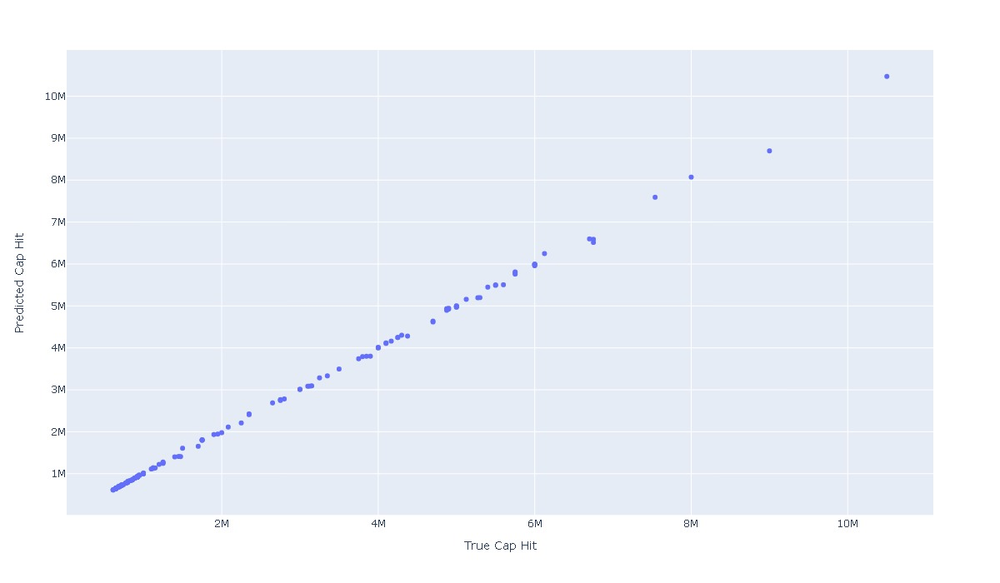

In [74]:
ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

## SGD
This model needs GridSearchCV again to find the alpha, loss, penalty, and learning rate parameters to optimize the function. The optimum values found for this model was an alpha of 9, a loss of huber, a penalty of L2, and a learning rate of optimal. This had issues with convergence in python's GridSearchCV that caused unpredictable accuracy with fit returning a score of 0.999 and then cross validation scores that would swing greatly. The accuracy of the other models allowed for SGD to not be considered given the python issues present.

In [75]:
from sklearn.linear_model import SGDRegressor

In [76]:
sgd=SGDRegressor()
parameters = {
    'alpha': range(1,10),
    'loss': ['squared_loss', 'huber', 'epsilon_insensitive'],
    'penalty': ['l2', 'l1', 'elasticnet'],
    'learning_rate': ['constant', 'optimal', 'invscaling'],
}
clf_GS = GridSearchCV(sgd, parameters)
clf_GS.fit(X, y)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:1185: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.



GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=SGDRegressor(alpha=0.0001, average=False,
                                    early_stopping=False, epsilon=0.1,
                                    eta0=0.01, fit_intercept=True,
                                    l1_ratio=0.15, learning_rate='invscaling',
                                    loss='squared_loss', max_iter=1000,
                                    n_iter_no_change=5, penalty='l2',
                                    power_t=0.25, random_state=None,
                                    shuffle=True, tol=0.001,
                                    validation_fraction=0.1, verbose=0,
                                    warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': range(1, 10),
                         'learning_rate': ['constant', 'optimal', 'invscaling'],
                         'loss': ['squared_loss', 'huber',
                                  'e

In [77]:
clf_GS.best_estimator_.get_params()

{'alpha': 9,
 'average': False,
 'early_stopping': False,
 'epsilon': 0.1,
 'eta0': 0.01,
 'fit_intercept': True,
 'l1_ratio': 0.15,
 'learning_rate': 'optimal',
 'loss': 'huber',
 'max_iter': 1000,
 'n_iter_no_change': 5,
 'penalty': 'elasticnet',
 'power_t': 0.25,
 'random_state': None,
 'shuffle': True,
 'tol': 0.001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [78]:
model=SGDRegressor(alpha= 8,
 average= False,
 early_stopping= False,
 epsilon= 0.1,
 eta0= 0.01,
 fit_intercept= True,
 l1_ratio= 0.15,
 learning_rate= 'optimal',
 loss= 'huber',
 max_iter= 1000,
 n_iter_no_change= 5,
 penalty= 'l2',
 power_t= 0.25,
 random_state= None,
 shuffle= True,
 tol= 0.001,
 validation_fraction= 0.1,
 verbose= 0,
 warm_start= False) 

In [79]:
model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test))
predictions=model.predict(X_test)
predictions=model.predict(X_test)
print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
cvScore=cross_val_score(model,X_test,y_test)
print('Cross validation score: [%.3f,%.3f,%.3f]'% (cvScore[0],cvScore[1],cvScore[2]))
print('R2 score: %.3f'% r2_score(y_test, predictions))
print('MSE: %.3f'% mean_squared_error(y_test, predictions))
stdv=np.sqrt(sum(((model.predict(X_test)) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval constant: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])


Percent of variance Explained: 0.997
Cross validation score: [-3.525,-18.246,-3.516]
R2 score: 0.994
MSE: 28377583912.846
Prediction Interval constant: 332145.900
95% likelihood that the true value is between 5725622.442 and 6389914.243
Predicted value: 6057768.342
True value: 5750000.000


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



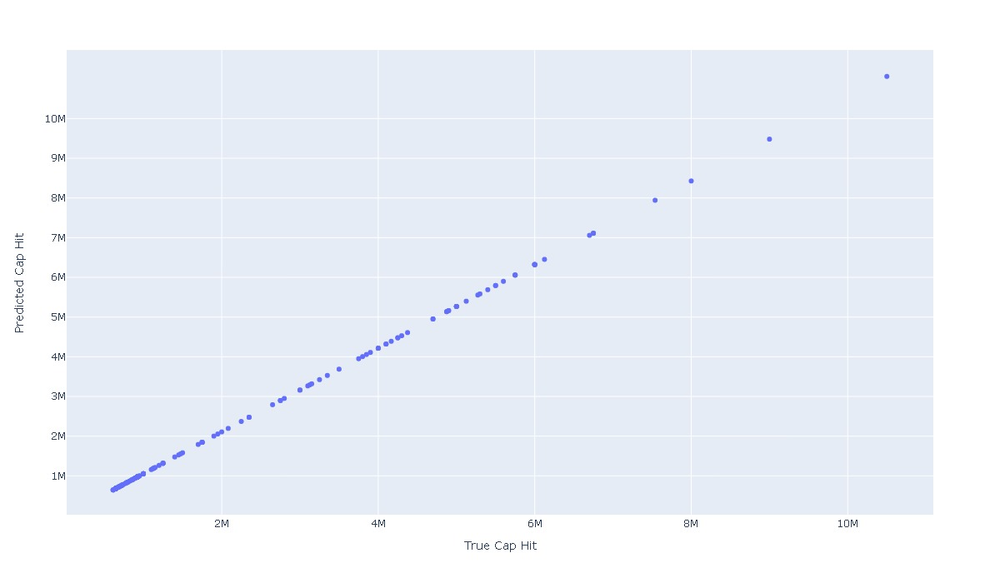

In [80]:
ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

# Bagging
Bagging used GridSearchCV on estimators, max features, max samples, boostrap, and boostrap features. This yeilded an estimators of 100, max features of 16, max samples 0.5, boostrap is False, and boostrap features os False.

In [81]:
from sklearn.ensemble import BaggingRegressor

model = BaggingRegressor(n_estimators = 500, max_samples = 500, max_features = X_test.shape[1])


In [82]:
parameters = {"n_estimators": [50,100,200],
              "max_features":[12,14,16],
              "max_samples": [0.4,0.5,0.1],
            "bootstrap": [True, False],
         "bootstrap_features": [True, False]}

clf_GS = GridSearchCV(model, parameters)
clf_GS.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=BaggingRegressor(base_estimator=None, bootstrap=True,
                                        bootstrap_features=False,
                                        max_features=16, max_samples=500,
                                        n_estimators=500, n_jobs=None,
                                        oob_score=False, random_state=None,
                                        verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'bootstrap': [True, False],
                         'bootstrap_features': [True, False],
                         'max_features': [12, 14, 16],
                         'max_samples': [0.4, 0.5, 0.1],
                         'n_estimators': [50, 100, 200]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [83]:
clf_GS.best_estimator_.get_params

<bound method BaseEstimator.get_params of BaggingRegressor(base_estimator=None, bootstrap=False, bootstrap_features=False,
                 max_features=16, max_samples=0.5, n_estimators=50, n_jobs=None,
                 oob_score=False, random_state=None, verbose=0,
                 warm_start=False)>

In [84]:
BaggingRegressor(base_estimator=None, bootstrap=False, bootstrap_features=False,
                 max_features=16, max_samples=0.5, n_estimators=100,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False)

BaggingRegressor(base_estimator=None, bootstrap=False, bootstrap_features=False,
                 max_features=16, max_samples=0.5, n_estimators=100,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False)

Here we see that Bagging produced an interval constant of 177,673 with a prediction that was close in our example. Since all of our models are relatively close (with the exception of PCA that we already handled) this gives me confidence that our models are performing nearly the same without much fear of overfitting.

In [85]:
model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test))
predictions=model.predict(X_test)
print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
print('R2 score: %.3f'% r2_score(y_test, predictions))
print('MSE: %.3f'% mean_squared_error(y_test, predictions))
stdv=np.sqrt(sum(((model.predict(X_test)) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval constant: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])

Percent of variance Explained: 0.998
R2 score: 0.998
MSE: 7648649556.773
Prediction Interval constant: 172438.235
95% likelihood that the true value is between 5584576.055 and 5929452.525
Predicted value: 5757014.290
True value: 5750000.000


Again, a similar plot to the above methods. This method, like decision trees, seems to have a hard time predicting the top tier, higher cap hit players compared to the lower cap hit levels.

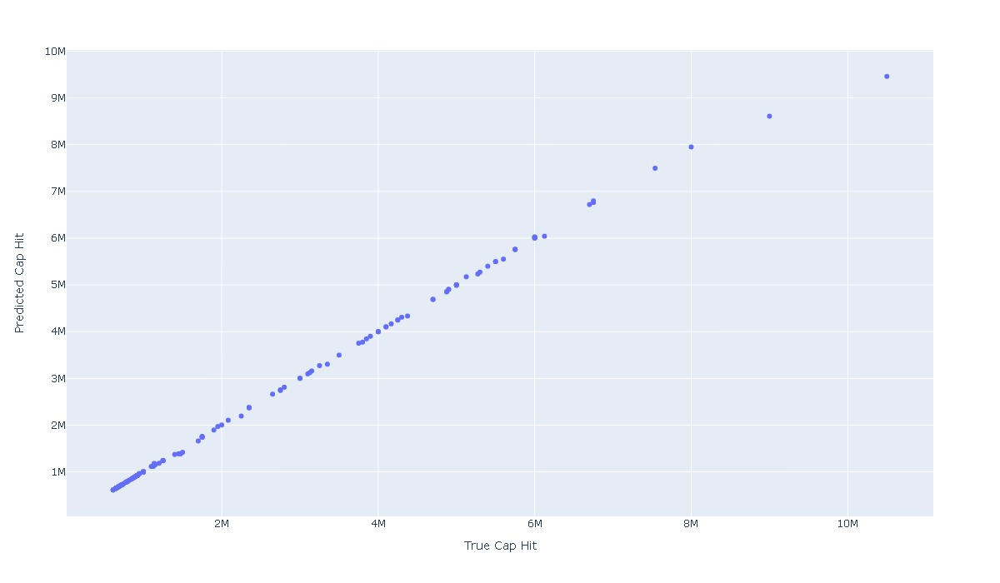

In [86]:
ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

# Results and Conclusions
Summarizing the results into a tables so that we can better see our results we have,

| SVR|	Decision Tree|	PCA w/ Linear Regression|	Boosting|	Bagging|
|---|---|---|---|---|
|0.312 | 	0.999 | 	1 | 	N/A | 	0.998 | 
|0.13 | 	0.999 | 	1 | 	N/A | 	0.998 | 
|-0.247 | 	0.991 | 	1 | 	N/A | 	N/A | 
|352353 | 	124593 | 	2e-12 | 	88744 | 	173115 | 

From here we see that Decision Tree performed the best (given that PCA is probably overfitting) and bagging is a close second. If we investigate further and plot these two models on top of eachother we see another relationship that is quite important for model selection. It appears that decision trees do predict values up to about 8 million better then boosting, then boosting does a better job for the higher values. With this in mind I would suggest using decsision tree for the under 8 million Cap Hit to get the best result for those values and boosting for Cap Hits higher then 8 million. This relationship would have to be tested further as there is only two predictions above the 8 million mark; however, that data is scare within the dataset so there is no good way to explore this as of now. As cap hits have risen over the years a more updated data set (which cannot be found) would be a good prospect for exploring this possible relationship.

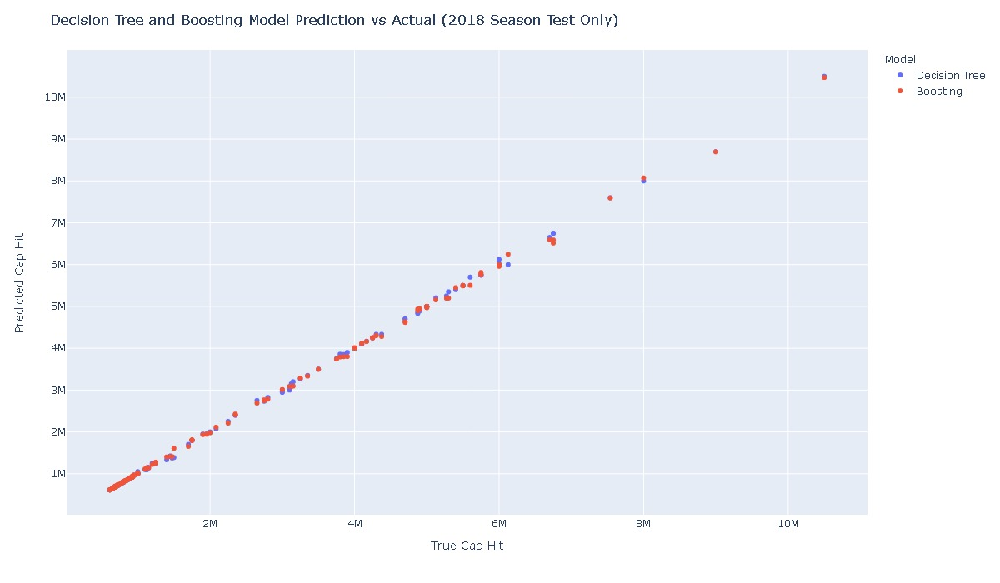

In [87]:
model=DecisionTreeRegressor(criterion='mae', max_depth=24, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')
model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test))
predictionsd=model.predict(X_test)
plotingd=pd.DataFrame(y_test)
plotingd['Prediction']=predictionsd
plotingd['Model']='Decision Tree'
plotingd.columns=['True Cap Hit','Predicted Cap Hit','Model']


predictionsb=bst.predict(dtest,ntree_limit=bst.best_ntree_limit)
plotingb=pd.DataFrame(y_test)
plotingb['Prediction']=predictionsb
plotingb['Model']='Boosting'
plotingb.columns=['True Cap Hit','Predicted Cap Hit','Model']

ploting=pd.concat([plotingd,plotingb])


fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit', color='Model')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.update_layout(
    title_text='Decision Tree and Boosting Model Prediction vs Actual (2018 Season Test Only)'
)
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

Since I do have access to the previous 2016-2017 season I ran the models on this data and got very good results. It is important that over a season we do not expect much change in players or cap hit as contracts usually last for multiple season; however, there should still be some churn and new contracts. Taking our model and running it on a previous season shows that boosting is probably the more prefered model overall with it performing well throughout. We see that boosting really does shine on the higher end cap hits with more data points to test on here; however, I would still like to see how the model performs moving forward rather then applying it backwards as this provides the most application and challenges for the model.

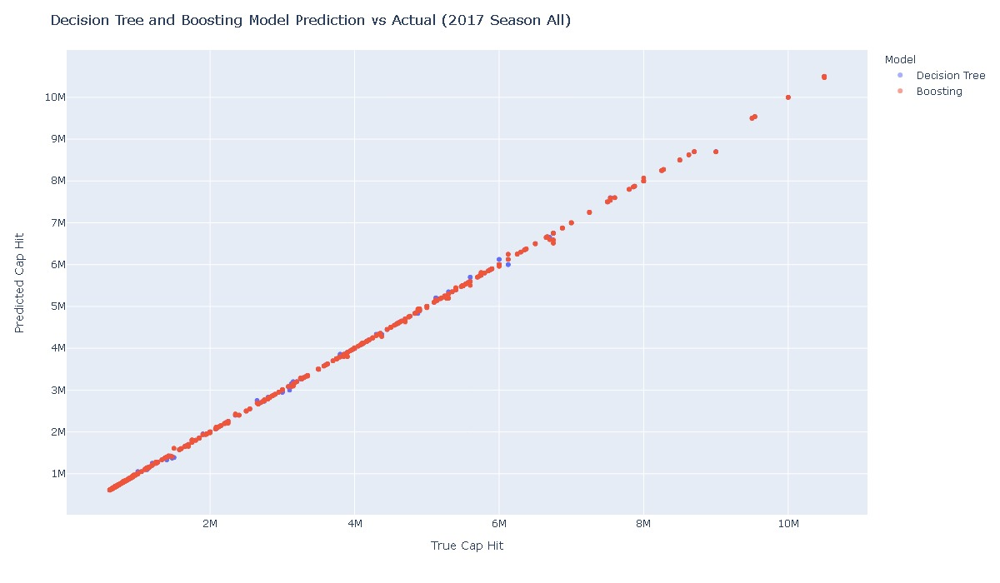

In [88]:
xls17 = pd.ExcelFile('NHL 2016-17.xls')
season17 = pd.read_excel(xls18, 'TOT',header=2)
season17Less=season17[['Last Name','Age','Seasons','Position','GP','G','A','PIM','TOI/GP','iCF','iSCF','Pass','OWAR','DWAR','Cap Hit']]
season17Less=season17Less[season17Less['Position']!='RW/C']
season17Less=season17Less[season17Less['Position']!='LW/C']
season17Less=season17Less[season17Less['Position']!='LW/RW']
season17Less=season17Less[season17Less['Position']!='C/RW']
season17Less.dropna(inplace=True)
season17Less.reset_index(inplace=True,drop=True)
season17Less=pd.get_dummies(season17Less, columns=['Position'])
season17Less=season17Less[season17Less.columns[1:]]
X_test=season17Less[season17Less.columns[:-1]]
y_test=season17Less['Cap Hit']


predictionsd=model.predict(X_test)
plotingd=pd.DataFrame(y_test)
plotingd['Prediction']=predictionsd
plotingd['Model']='Decision Tree'
plotingd.columns=['True Cap Hit','Predicted Cap Hit','Model']

dtest=xgb.DMatrix(X_test,y_test)
predictionsb=bst.predict(dtest,ntree_limit=bst.best_ntree_limit)
plotingb=pd.DataFrame(y_test)
plotingb['Prediction']=predictionsb
plotingb['Model']='Boosting'
plotingb.columns=['True Cap Hit','Predicted Cap Hit','Model']

ploting=pd.concat([plotingd,plotingb])


fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit', color='Model',opacity=[0.8,0.3])
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.update_layout(
    title_text='Decision Tree and Boosting Model Prediction vs Actual (2017 Season All)'
)
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)

# Future Work
I would like to, as mentioned, be able to apply this to new data for seasons after the 2018 season if/when that data becomes available. In addition I would like to make the analysis more robust so that it could classify players that are over/under performing. The major limitation to this model is that it is only trained on 1 season's worth of data so extending this to have a performance over time aspect would be more benefitial given the nature of contracts being several years long. This performance over time aspect I thin could be used to build out contract length to be associated with contract value and would be a very robust model for the contract as a whole.

display(Latex(r"\newpage"))

# Reference Page
- Hyndman, R.J., & Athanasopoulos, G. (2018) Forecasting: principles and practice, 2nd edition, OTexts: Melbourne, Australia. OTexts.com/fpp2. Accessed on 12/7/20.
- “NHL Stats, History, Scores, &amp; Records.” Hockey, 2018, www.hockey-reference.com/. 
- Stephens, Eric. “To Keep Coveted Defenders, Ducks Sacrifice Shea Theodore as Vegas Takes Clayton Stoner.” Orange County Register, Orange County Register, 22 June 2017, www.ocregister.com/2017/06/21/to-keep-coveted-defenders-ducks-sacrifice-shea-theodore-as-vegas-takes-clayton-stoner/. 
- Vollman, Rob. “Download Statistics.” Hockey Abstract, 2018, www.hockeyabstract.com/testimonials. 
- Camnugent. “NHL Salary Data Prediction: Cleaning and Modeling.” Kaggle, Kaggle, 26 Jan. 2018, www.kaggle.com/camnugent/nhl-salary-data-prediction-cleaning-and-modeling. 
- Mikeroher, n. “Mikeroher/Nhl-Salary-Analytics.” GitHub, 2017, github.com/mikeroher/nhl-salary-analytics. 
- Seregelyi, Viktor. “Predicting NHL Player Salaries.” Viktor Seregelyi, 13 May 2019, viktorseregelyi.github.io/hockey/. 
- Kahane, Leo. (2001). Team and Player Effects on NHL Player Salaries: A Hierarchical Linear Model Approach.. Applied Economics Letters. 8. 629-32. 10.1080/13504850010028607. 

display(Latex(r"\newpage"))

# Appendix: Python Code

#libraries to be used
#jupyter nbconvert --to hide_code_latexpdf Final_Again.ipynb
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import time
import xlsxwriter
from PIL import Image
import os
from PIL.ExifTags import TAGS
import piexif
import random
from os import listdir
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.datasets import load_boston

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import plotly

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import RidgeCV, LassoCV, Ridge, Lasso
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.metrics import accuracy_score
from sklearn.utils import resample
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix 
from sklearn.pipeline import Pipeline
from sklearn import decomposition, datasets
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn import datasets, svm
from sklearn.svm import SVC
from sklearn.metrics import explained_variance_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error


import warnings
get_ipython().run_line_magic('matplotlib', 'inline')



#figure printing settings
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'png')
plt.rcParams['savefig.dpi'] = 75
plt.rcParams['figure.autolayout'] = False
plt.rcParams['figure.figsize'] = 10, 6
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['font.size'] = 16
plt.rcParams['lines.linewidth'] = 2.0
plt.rcParams['lines.markersize'] = 8
plt.rcParams['legend.fontsize'] = 14

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = "serif"
plt.rcParams['font.serif'] = "cm"
#plt.rcParams['text.latex.preamble'] = r"\usepackage{subdepth}, \usepackage{type1cm}"




#Read in file
xls18 = pd.ExcelFile('NHL 2017-18.xls')
season18 = pd.read_excel(xls18, 'TOT',header=2)



#preview of data
season18.head()




#create correlation matrix for heat map
corr = season18[season18.columns[0:100]].corr()




#an example of the correlation issue
sns.heatmap(corr.loc[corr.columns[0:50],corr.columns[0:50]], cmap=plt.cm.Reds)




season18Less=season18[['Last Name','Age','Seasons','Position','GP','G','A','PIM','TOI/GP','iCF','iSCF','Pass','OWAR','DWAR','Cap Hit']]
#season18Less=season18[['Cap Hit']]




season18['Position'].unique()




season18Less=season18Less[season18Less['Position']!='RW/C']
season18Less=season18Less[season18Less['Position']!='LW/C']
season18Less=season18Less[season18Less['Position']!='LW/RW']
season18Less=season18Less[season18Less['Position']!='C/RW']




season18Less.dropna(inplace=True)



season18Less.reset_index(inplace=True,drop=True)


season18HC=season18Less.copy()


season18Less=pd.get_dummies(season18Less, columns=['Position'])
season18Less=season18Less[season18Less.columns[1:]]



corr=season18Less.corr()
sns.heatmap(corr.loc[corr.columns[0:13],corr.columns[0:13]],annot=True, cmap=plt.cm.Reds)



import plotly.express as px
import plotly.graph_objects as go
#from pdpbox.pdp import pdp_interact,pdp_interact_plot
from IPython.display import Image



season18HC.loc[~((season18HC['G']>season18HC['G'].quantile(.99))|(season18HC['A']>season18HC['A'].quantile(.99))|
            (season18HC['PIM']>season18HC['PIM'].quantile(.99))|(season18HC['DWAR']<season18HC['DWAR'].quantile(.005))|
            (season18HC['OWAR']<season18HC['OWAR'].quantile(.005))|(season18HC['OWAR']>season18HC['OWAR'].quantile(.995))|
            (season18HC['TOI/GP']>season18HC['TOI/GP'].quantile(.99))|(season18HC['DWAR']>season18HC['DWAR'].quantile(.995))|
            (season18HC['Pass']>season18HC['Pass'].quantile(.99))|(season18HC['Seasons']>season18HC['Seasons'].quantile(.99))|
            (season18HC['iCF']>season18HC['iCF'].quantile(.99))|(season18HC['iSCF']>season18HC['iSCF'].quantile(.99))|
            (season18HC['Cap Hit']>season18HC['Cap Hit'].quantile(.99))),'Last Name']




#remove names that are not in the top 1% of at least one of the metrics to clean up graphing
season18HC.loc[~((season18HC['G']>season18HC['G'].quantile(.99))|(season18HC['A']>season18HC['A'].quantile(.99))|
            (season18HC['PIM']>season18HC['PIM'].quantile(.99))|(season18HC['DWAR']<season18HC['DWAR'].quantile(.005))|
            (season18HC['OWAR']<season18HC['OWAR'].quantile(.005))|(season18HC['OWAR']>season18HC['OWAR'].quantile(.995))|
            (season18HC['TOI/GP']>season18HC['TOI/GP'].quantile(.99))|(season18HC['DWAR']>season18HC['DWAR'].quantile(.995))|
            (season18HC['Pass']>season18HC['Pass'].quantile(.99))|(season18HC['Seasons']>season18HC['Seasons'].quantile(.99))|
            (season18HC['iCF']>season18HC['iCF'].quantile(.99))|(season18HC['iSCF']>season18HC['iSCF'].quantile(.99))|\
            (season18HC['Cap Hit']>season18HC['Cap Hit'].quantile(.99))),'Last Name']=''



season18HCAgg=season18HC.groupby(['Position']).mean().reset_index()


fig = px.bar(season18HCAgg, x='Position', y='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.bar(season18HCAgg, x='Position', y='G')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)




fig = px.bar(season18HCAgg, x='Position', y='A')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.bar(season18HCAgg, x='Position', y='TOI/GP')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.bar(season18HCAgg, x='Position', y='Pass')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.bar(season18HCAgg, x='Position', y='iCF')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.bar(season18HCAgg, x='Position', y='iSCF')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


fig = px.bar(season18HCAgg, x='Position', y='Age')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)




fig = px.scatter(season18HC, x='A',
    y='G',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='Age',
    y='G',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='G',
    y='iSCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='Age',
    y='A',text='Last Name',color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='Age',
    y='Pass',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='A',
    y='Pass',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)




fig = px.scatter(season18HC, x='Age',
    y='DWAR',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)




fig = px.scatter(season18HC, x='Age',
    y='OWAR',text='Last Name', color='Cap Hit')
fig.show()

image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)




fig = px.scatter(season18HC, x='DWAR',
    y='OWAR',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)




fig = px.scatter(season18HC, x='DWAR',
    y='OWAR', size='Cap Hit',text='Last Name', color='Position')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='Age',
    y='iCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='G',
    y='iCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='G',
    y='iCF', size='Cap Hit',text='Last Name', color='Position')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='A',
    y='iCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


fig = px.scatter(season18HC, x='G',
    y='iCF', size='Cap Hit',text='Last Name', color='Position')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


fig = px.scatter(season18HC, x='Age',
    y='TOI/GP',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


fig = px.scatter(season18HC, x='TOI/GP',
    y='iCF',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='TOI/GP',
    y='iCF', size='Cap Hit',text='Last Name', color='Position')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


fig = px.scatter(season18HC, x='Age',
    y='PIM',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


fig = px.scatter(season18HC, x='TOI/GP',
    y='PIM',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='Age',
    y='Seasons',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



fig = px.scatter(season18HC, x='Seasons',
    y='TOI/GP',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


season18HC.head()



fig = px.scatter(season18HC, x='Age',
    y='GP',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)




fig = px.scatter(season18HC, x='GP',
    y='TOI/GP',text='Last Name', color='Cap Hit')
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



X=season18Less[season18Less.columns[:-1]]
y=season18Less['Cap Hit']



X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 0)


model = svm.SVR()
print(model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test)))
predictions=model.predict(X_test)


from sklearn.model_selection import GridSearchCV 
param_grid = {'C': np.arange(9000, 10000, 100).tolist(),  
              'gamma': [pow(10,-9),pow(10,-10),pow(10,-11),pow(10,-12),pow(10,-13),pow(10,-14),pow(10,-15)], 
              'kernel': ['rbf']}
model = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3) 
model.fit(X_train, y_train) 



model.best_estimator_.get_params()



model = svm.SVR(C= 9901,
 cache_size= 200,
 coef0= 0.0,
 degree= 3,
 epsilon= 300000,
 gamma= 1e-14,
 kernel= 'rbf',
 max_iter= -1,
 shrinking= True,
 tol= 0.001,
 verbose= False)
model.fit(X_train, y_train) 


print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
cvScore=cross_val_score(model,X_test,y_test)
print('Cross validation score: [%.3f,%.3f,%.3f]'% (cvScore[0],cvScore[1],cvScore[2]))
print('R2 score: %.3f'% r2_score(y_test, predictions))

stdv=np.sqrt(sum(((model.predict(X_test)) - y_test)\**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval Standard Deviation: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])



ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



std_slc = StandardScaler()
pca = decomposition.PCA()
dec_tree = tree.DecisionTreeRegressor()
svr = svm.SVR()



pipe = Pipeline(steps=[('std_slc', std_slc),
                           ('pca', pca),
                           ('dec_tree', dec_tree)])



n_components = list(range(1,X.shape[1]+1,1))
criterion = ['mse', 'friedman_mse', 'mae']
max_depth = [12,14,16,18,20,22,24,26,28,30]

parameters = dict(pca__n_components=n_components,
                      dec_tree__criterion=criterion,
                      dec_tree__max_depth=max_depth)
clf_GS = GridSearchCV(pipe, parameters)
clf_GS.fit(X, y)




print('Best Criterion:', clf_GS.best_estimator_.get_params()['dec_tree__criterion'])
print('Best max_depth:', clf_GS.best_estimator_.get_params()['dec_tree__max_depth'])
print('Best Number Of Components:', clf_GS.best_estimator_.get_params()['pca__n_components'])
print(); print(clf_GS.best_estimator_.get_params()['dec_tree'])
print(); print(clf_GS.best_estimator_.get_params()['pca'])
print(); print(clf_GS.best_estimator_.get_params()['std_slc'])




model=DecisionTreeRegressor(criterion='mae', max_depth=24, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')




model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test))
predictions=model.predict(X_test)
print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
cvScore=cross_val_score(model,X_test,y_test)
print('Cross validation score: [%.3f,%.3f,%.3f]'% (cvScore[0],cvScore[1],cvScore[2]))
print('R2 score: %.3f'% r2_score(y_test, predictions))
print('MSE: %.3f'% mean_squared_error(y_test, predictions))
stdv=np.sqrt(sum(((model.predict(X_test)) - y_test)\**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval constant: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])



ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


from sklearn import tree
tree.plot_tree(model,max_depth=5,filled=True)




from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_predict
pca=PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False).fit(X_train)
pcatrain_x = pca.transform(X_train)
pcatest_x = pca.transform(X_test)
reg = LinearRegression()
reg.fit(pcatrain_x, y_train)
predictions=reg.predict(pcatest_x)

#predictions=cross_val_predict(reg, pcatest_x, y_test, cv=10)

print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
cvScore=cross_val_score(reg,X_test,y_test)
print('Cross validation score: [%.3f,%.3f,%.3f]'% (cvScore[0],cvScore[1],cvScore[2]))
print('R2 score: %.3f'% r2_score(y_test, predictions))
print(mean_squared_error(y_test, predictions))
stdv=np.sqrt(sum(((reg.predict(pcatest_x)) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval length: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])



ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



import xgboost as xgb
dtrain=xgb.DMatrix(X_train,y_train)
dtest=xgb.DMatrix(X_test,y_test)
params={
    'objective':"reg:squarederror",
    'eval_metric':["rmse","mae"]
}
evallist=[(dtest,'eval'),(dtrain,'train')]



num_round = 1000
bst=xgb.train(params,dtrain, num_round, evallist,early_stopping_rounds=10)
predictions=bst.predict(dtest,ntree_limit=bst.best_ntree_limit)



predictions=bst.predict(dtest,ntree_limit=bst.best_ntree_limit)


stdv=np.sqrt(sum((bst.predict(dtest,ntree_limit=bst.best_ntree_limit) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])


ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



from sklearn.linear_model import SGDRegressor


sgd=SGDRegressor()
parameters = {
    'alpha': range(1,10),
    'loss': ['squared_loss', 'huber', 'epsilon_insensitive'],
    'penalty': ['l2', 'l1', 'elasticnet'],
    'learning_rate': ['constant', 'optimal', 'invscaling'],
}
clf_GS = GridSearchCV(sgd, parameters)
clf_GS.fit(X, y)


clf_GS.best_estimator_.get_params()


model=SGDRegressor(alpha= 8,
 average= False,
 early_stopping= False,
 epsilon= 0.1,
 eta0= 0.01,
 fit_intercept= True,
 l1_ratio= 0.15,
 learning_rate= 'optimal',
 loss= 'huber',
 max_iter= 1000,
 n_iter_no_change= 5,
 penalty= 'l2',
 power_t= 0.25,
 random_state= None,
 shuffle= True,
 tol= 0.001,
 validation_fraction= 0.1,
 verbose= 0,
 warm_start= False) 



model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test))
predictions=model.predict(X_test)
predictions=model.predict(X_test)
print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
cvScore=cross_val_score(model,X_test,y_test)
print('Cross validation score: [%.3f,%.3f,%.3f]'% (cvScore[0],cvScore[1],cvScore[2]))
print('R2 score: %.3f'% r2_score(y_test, predictions))
print('MSE: %.3f'% mean_squared_error(y_test, predictions))
stdv=np.sqrt(sum(((model.predict(X_test)) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval constant: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])


ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


from sklearn.ensemble import BaggingRegressor

model = BaggingRegressor(n_estimators = 500, max_samples = 500, max_features = X_test.shape[1])



parameters = {"n_estimators": [50,100,200],
              "max_features":[12,14,16],
              "max_samples": [0.4,0.5,0.1],
            "bootstrap": [True, False],
         "bootstrap_features": [True, False]}

clf_GS = GridSearchCV(model, parameters)
clf_GS.fit(X_train,y_train)


clf_GS.best_estimator_.get_params


BaggingRegressor(base_estimator=None, bootstrap=False, bootstrap_features=False,
                 max_features=16, max_samples=0.5, n_estimators=100,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False)


model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test))
predictions=model.predict(X_test)
print('Percent of variance Explained: %.3f'% explained_variance_score(y_test, predictions))
print('R2 score: %.3f'% r2_score(y_test, predictions))
print('MSE: %.3f'% mean_squared_error(y_test, predictions))
stdv=np.sqrt(sum(((model.predict(X_test)) - y_test)**2) / (len(y_test) - 2))
interval = 1.96 * stdv
lower, upper = predictions[0]-interval, predictions[0] + interval
print('Prediction Interval constant: %.3f' % interval)
print('95%% likelihood that the true value is between %.3f and %.3f' % (lower, upper))
print('Predicted value: %.3f' % predictions[0])
print('True value: %.3f' % y_test.iloc[0])


ploting=pd.DataFrame(y_test)
ploting['Prediction']=predictions
ploting.columns=['True Cap Hit','Predicted Cap Hit']
fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


model=DecisionTreeRegressor(criterion='mae', max_depth=24, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')
model.fit(np.array(X_train), np.array(y_train)).score(np.array(X_test), np.array(y_test))
predictionsd=model.predict(X_test)
plotingd=pd.DataFrame(y_test)
plotingd['Prediction']=predictionsd
plotingd['Model']='Decision Tree'
plotingd.columns=['True Cap Hit','Predicted Cap Hit','Model']


predictionsb=bst.predict(dtest,ntree_limit=bst.best_ntree_limit)
plotingb=pd.DataFrame(y_test)
plotingb['Prediction']=predictionsb
plotingb['Model']='Boosting'
plotingb.columns=['True Cap Hit','Predicted Cap Hit','Model']

ploting=pd.concat([plotingd,plotingb])


fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit', color='Model')
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.update_layout(
    title_text='Decision Tree and Boosting Model Prediction vs Actual (2018 Season Test Only)'
)
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)



xls17 = pd.ExcelFile('NHL 2016-17.xls')
season17 = pd.read_excel(xls18, 'TOT',header=2)
season17Less=season17[['Last Name','Age','Seasons','Position','GP','G','A','PIM','TOI/GP','iCF','iSCF','Pass','OWAR','DWAR','Cap Hit']]
season17Less=season17Less[season17Less['Position']!='RW/C']
season17Less=season17Less[season17Less['Position']!='LW/C']
season17Less=season17Less[season17Less['Position']!='LW/RW']
season17Less=season17Less[season17Less['Position']!='C/RW']
season17Less.dropna(inplace=True)
season17Less.reset_index(inplace=True,drop=True)
season17Less=pd.get_dummies(season17Less, columns=['Position'])
season17Less=season17Less[season17Less.columns[1:]]
X_test=season17Less[season17Less.columns[:-1]]
y_test=season17Less['Cap Hit']


predictionsd=model.predict(X_test)
plotingd=pd.DataFrame(y_test)
plotingd['Prediction']=predictionsd
plotingd['Model']='Decision Tree'
plotingd.columns=['True Cap Hit','Predicted Cap Hit','Model']

dtest=xgb.DMatrix(X_test,y_test)
predictionsb=bst.predict(dtest,ntree_limit=bst.best_ntree_limit)
plotingb=pd.DataFrame(y_test)
plotingb['Prediction']=predictionsb
plotingb['Model']='Boosting'
plotingb.columns=['True Cap Hit','Predicted Cap Hit','Model']

ploting=pd.concat([plotingd,plotingb])


fig = px.scatter(ploting, x='True Cap Hit',
    y='Predicted Cap Hit', color='Model',opacity=[0.8,0.3])
fig.update_yaxes(tickvals=np.arange(1000000, 11000000, 1000000).tolist())
fig.update_layout(
    title_text='Decision Tree and Boosting Model Prediction vs Actual (2017 Season All)'
)
fig.show()
image_bytes = fig.to_image(format='jpeg', width=1200, height=700, scale=1) # you can use other formats as well (like 'svg','jpeg','pdf')

Image(image_bytes)


